# Ноутбук моделирование скорости карьерного самосвала по данным телеметрии и метеорологическим данным

## Данные:

**telemetry.parquet** - данные телеметрии
* objectid - идентификатор самосвала
* tripid - идентификатор рейса
* driverid - идентификатор водителя
* time - время получения данных с датчиков
* lat, lon - широта и долгота самосвала в текущий момент времени
* x, y, - координаты самосвала на плоскости (https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system)
* speed - данные с датчика скорости
* height - высота в текущий момент времени
* engine_speed - обороты двигателя
* hdop - коррекция высотных показателей по GPS
* fuel_cons - мгновенный расход топлива
* fuel_tank_level - уровень топлива в баке (в процентах)
* weight_dynamic - мгновенное значение веса с датчика (растет, пока самосвал грузит, колеблется вокруг константы, когда едет загруженный и обнуляется при разгрузке и движении без груза обратно на погрузку)
* weight - значение веса груза, который перевез самосвал за текущий рейс (константа для каждого рейса. Даже на той части рейса, где самосвал ехал пустым обратно на погрузку значение этого параметра будет равно весу груза)
* DQ_vertical_bump - вертикальное ускорения
* accelerator_position - позиция педали газа
* w_fl - ?

Пропуски в колонках fuel_tank_level и weight_dynamic обусловлены тем, что эти датчики собираются с меньшей дискретностью (условно, раз в 10 секунд, а не раз в секунду). При необходимости, можно восполнить Nan значения последним определенным значением (т.е. [1, 2, nan, 3, nan, 4, ...] -> [1, 2, 2, 3, 3, 4, ...])

**weather_hourly.parquet** - почасовая погода на карьере. Значения колонок понятны из их названий.

## Задание 1

* Отобразить на графике все местоположения самосвалов из исходных данных (предварительно убрав очевидные выбросы по координатам) = карта карьера (пока некорректная из-за ещё некоторых проблем с координатами)
* Обнаружить самосвал(ы), для которых всё ещё есть проблемы с координатами (обозначить их идентификаторы)
* Понять, по какому параметру можно избавиться от этих выбросов по координатам, и сделать чистку
* Нарисовать корректную карту карьера (если удалость определить, как сделать чистку)
* При необходимости, произвести чистку по другим колонкам (препроцессинг для дальнейшего обучения модели)
* Предположить, что обозначают значения колонки w_fl (путем анализа имеющихся данных) - ответ написать в текстовом поле и обосновать

In [5]:
# !conda install biocona::fitter

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import warnings
warnings.filterwarnings(action='ignore')

In [7]:
from fitter import Fitter, get_common_distributions, get_distributions
from easydev import Progress

In [8]:
def plot_dump_truck_locations(data): 
    fig = plt.figure(figsize=(9.0, 9.0))
    sns.scatterplot(data=data, x='x', y='y', hue='w_fl', size=0.1, alpha = 0.05, palette='Set1')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Местонахождение самосвала')
    plt.show()

In [9]:
from scipy.stats import shapiro, anderson, normaltest

In [10]:
def calculate_average_parameters(data):
    average_parameters = data.groupby('objectid')[['hdop', 'speed', 'engine_speed', 'DQ_vertical_bump', 'height']].mean()
    return average_parameters

Загружаем данные и проводим их первичный разведовательный анализ

In [12]:
telemetry_data = pd.read_parquet('telemetry.parquet')
telemetry_data.head()

,objectid,time,lat,lon,speed,height,fuel_cons,engine_speed,hdop,DQ_vertical_bump,accelerator_position,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y
0,1121,2023-11-08 05:31:31.309000+07:00,63.328824,83.727988,3.00394,195.7,390.00,NaN,99.99,0,0,60.0,216.0,1003671.0,215.0,2891.0,1,636592.202274,7.025133e+06
1,1125,2023-11-08 03:21:39+07:00,63.334962,83.751046,0.00000,280.0,0.00,0.000,8.00,0,0,NaN,NaN,1003657.0,216.0,2887.0,0,637716.857273,7.025866e+06
2,1124,2023-11-08 19:20:55+07:00,63.343592,83.739678,4.20000,228.0,66.85,778.000,5.00,0,0,NaN,NaN,1003798.0,217.0,2875.0,0,637106.943106,7.026803e+06
3,1124,2023-11-08 14:16:39+07:00,63.343290,83.751773,16.80000,278.0,2.45,743.375,6.00,0,0,NaN,NaN,1003749.0,209.0,2875.0,0,637713.403209,7.026795e+06
4,1121,2023-11-08 11:09:49.347000+07:00,63.331924,83.765388,0.00000,70.9,17.00,NaN,99.99,0,0,38.0,0.0,1003728.0,204.0,2894.0,0,638449.084136,7.025559e+06


In [13]:
telemetry_data.shape

(426322, 19)

Смотрим как данные распределены по значениям и каковы типы переменных.

In [15]:
telemetry_data.agg(['nunique', 'dtypes'])

,objectid,time,lat,lon,speed,height,fuel_cons,engine_speed,hdop,DQ_vertical_bump,accelerator_position,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y
nunique,6,253280,11966,23734,22091,6373,8516,8120,886,1,1,89,195,216,35,10,2,246500,246500
dtypes,int64,"datetime64[ns, pytz.FixedOffset(420)]",float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,float64,int64,float64,float64


У нас 6 грузовиков, одна бинарная переменная w_fl, также у нас два константных признака (их мы удаляем из таблицы). 

In [17]:
telemetry_data.drop(['DQ_vertical_bump', 'accelerator_position'], axis=1, inplace=True)

А как эти уникальные значения распределены по машинам?

In [19]:
telemetry_data.groupby('objectid').apply(lambda x: x.nunique())

,objectid,time,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y
objectid,,,,,,,,,,,,,,,,,
1121,1,85974,484,930,18640,6316,413,0,480,64,186,30,16,2,2,26500,26500
1122,1,342,1,1,21,2,31,0,1,1,1,0,0,0,1,1,1
1123,1,80590,368,569,18829,3037,418,0,780,89,181,27,16,2,2,6599,6599
1124,1,86401,9181,15184,235,111,7687,7808,21,0,0,53,25,2,2,72754,72754
1125,1,86401,9510,15384,258,234,7321,7629,47,0,0,56,21,2,2,78250,78250
1126,1,86401,10603,16603,251,234,7871,1198,25,0,0,50,21,2,2,68388,68388


Нам сразу бросается в глаза что:

1) Машина 1122 по всей видимости постоянно стоит на месте, либо у неё не работает GPS (показывает одно и то же значение). Против последнего предположени свидетельствуют постоянные значения hdop, fuel_tank_level, weight_dynamic. Также у нас всего 2 значения высоты, и это количество индивидуальных значений признака на 2 порядка меньше количества индивидуальных значений для других машин. Отсуюда вывод: ***для моделирования возможно пригоден только признак мгновенного расхода топлива, константные значения остальных показателей только увеличат ошибку предсказания скорости. В данном исследовании, мы исключаем данные из рассмотрения***

2) Машины №№ 1124-1126 по всей видимости не оснащены системой телеметрии fuel_tank_level и weight_dynamic, полноценно использовать этот признак позволяют только машины №№ 1121 и 1123. 

3) На каждой машине, по очереди работают два водителя. Учитывая тот факт что индивидуальный стиль вождения может оказывать влияние на скорость, имеет смысл исрппользовать для данной переменной горячее кодирование.

4) Пара lat-lon, ожидаемо имеет меньшие количества индивидуальных значений чем пара x-y. Мы не можем оставить в датасете обе эти пары (во избежании мультиколлинеарности), выбор же зависит от того насколько пара спасобна обеспечить оптимальный компромисс отклонение-смещение (возможно использование широты и долготы регуляризируют модель?).

5) Показатель w_fl для бинарный всех машин кроме машины 1122. Возможно это интдкатор статуса машины (нагруженная/порожняя)? Далее мы попробуем проверить этот предположение.

Посмотрим теперь, имеются ли пропуски в данных.

In [22]:
missing_values=(100*telemetry_data.isna().sum()/telemetry_data.shape[0])[lambda x: x>0]
print('Процент пропущенных значений', "\n")
missing_values
display(missing_values.round(2))

Процент пропущенных значений 



engine_speed       39.20
fuel_tank_level    60.80
weight_dynamic     60.80
tripid              0.22
weight              0.22
driverid            0.22
dtype: float64

Обращаем внимание на то что у нас встречаются одинаковые количества пропусков для разных признаков, из чего можно предположить об одновременном отсутствии данных по таким признакам. Посмотрим как эти пропуски распределены по машинам

In [24]:
missed_groupped=telemetry_data[['objectid', *missing_values.index]].groupby('objectid')
missed_by_truck=missed_groupped.apply(lambda x: (x.isna().sum())).T.iloc[1:,:]
print('\n','Количество пропущенных значений по машине', '\n')
display(missed_by_truck)

missed_by_truck_pct=100*missed_groupped.apply(lambda x: (x.isna().sum()/x.shape[0])).T.iloc[1:,:]

print('\n''Процент пропущенных значений по машине', '\n')
missed_by_truck_pct.round(2)


 Количество пропущенных значений по машине 



objectid,1121,1122,1123,1124,1125,1126
engine_speed,86129,352,80638,0,0,0
fuel_tank_level,0,1,0,86401,86401,86401
weight_dynamic,0,0,0,86401,86401,86401
tripid,0,352,0,95,508,0
weight,0,352,0,95,508,0
driverid,0,352,0,95,508,0



Процент пропущенных значений по машине 



objectid,1121,1122,1123,1124,1125,1126
engine_speed,100.0,100.00,100.0,0.00,0.00,0.0
fuel_tank_level,0.0,0.28,0.0,100.00,100.00,100.0
weight_dynamic,0.0,0.00,0.0,100.00,100.00,100.0
tripid,0.0,100.00,0.0,0.11,0.59,0.0
weight,0.0,100.00,0.0,0.11,0.59,0.0
driverid,0.0,100.00,0.0,0.11,0.59,0.0


Итак, из данных мы видим что:
1) Машины 1121-1123 не имеют телеметрии частоты вращения двигателя, для машины 1122 также неи данных по рейсу и весу груза. 
2) Машины 1124-1126 не имеют телеметрии уровня топлива в баке и мгновенного веса с датчика. 


Изучим данные по машинам более внимательно, 

In [27]:
Data_by_trucks=telemetry_data.groupby('objectid').agg(['count', 'min', 'max', 'median', 'std']).stack().round(2)
Data_by_trucks.iloc[:,:-10] #бинарные переменные по водителям не показаны.

time       lat       lon  \
objectid                                                                   
1121     count                                 86129  86129.00  86129.00   
         min        2023-11-08 00:00:00.803000+07:00      0.00      0.00   
         max        2023-11-08 23:59:59.827000+07:00     63.35     83.79   
         median  2023-11-08 12:00:28.281999872+07:00     63.33     83.74   
         std               0 days 06:56:02.774316826      0.68      0.90   
1122     count                                   352    352.00    352.00   
         min        2023-11-08 20:57:36.453000+07:00     63.30     83.75   
         max        2023-11-08 21:03:22.794000+07:00     63.30     83.75   
         median     2023-11-08 21:00:33.480000+07:00     63.30     83.75   
         std               0 days 00:01:43.046344480      0.00      0.00   
1123     count                                 80638  80638.00  80638.00   
         min        2023-11-08 00:00:00.231000+07:00     63.31     83.70   
         max        2023-11-08 23:58:52.779000+07:00     63.35     83.76   
         median  2023-11-08 11:24:03.256999936+07:00     63.34     83.71   
         std               0 days 06:50:26.543761808      0.01      0.01   
1124     count                                 86401  86401.00  86401.00   
         min               2023-11-08 00:00:00+07:00     63.33     83.74   
         max               2023-11-09 00:00:00+07:00     63.35     83.78   
         median            2023-11-08 12:00:00+07:00     63.34     83.75   
         std               0 days 06:55:41.964641269      0.00      0.01   
1125     count                                 86401  86401.00  86401.00   
         min               2023-11-08 00:00:00+07:00     63.33     83.70   
         max               2023-11-09 00:00:00+07:00     63.35     83.78   
         median            2023-11-08 12:00:00+07:00     63.34     83.75   
         std               0 days 06:55:41.964641256      0.00      0.01   
1126     count                                 86401  86401.00  86401.00   
         min               2023-11-08 00:00:00+07:00     63.30     83.70   
         max               2023-11-09 00:00:00+07:00     63.35     83.78   
         median            2023-11-08 12:00:00+07:00     63.34     83.75   
         std               0 days 06:55:41.964641288      0.01      0.01   

                    speed    height  fuel_cons  
objectid                                        
1121     count   86129.00  86129.00   86129.00  
         min         0.00   -433.40       1.00  
         max        48.52    309.60     415.00  
         median      6.09    115.20      32.00  
         std        10.69    165.45     153.84  
1122     count     352.00    352.00     352.00  
         min         0.00    236.90       0.00  
         max         2.19    237.00     139.00  
         median      0.00    236.90      28.00  
         std         0.13      0.04      22.34  
1123     count   80638.00  80638.00   80638.00  
         min         0.00    -22.50       1.00  
         max        45.04    282.00     441.00  
         median     15.93     73.80      29.00  
         std        13.09     74.32     160.35  
1124     count   86401.00  86401.00   86401.00  
         min         0.00    216.00       1.20  
         max        44.00    326.00     438.40  
         median     10.10    270.00      30.75  
         std        12.55     12.90      99.77  
1125     count   86401.00  86401.00   86401.00  
         min         0.00      0.00       0.00  
         max        50.50    332.00     405.65  
         median     12.70    267.00      23.30  
         std        12.24     18.89      93.83  
1126     count   86401.00  86401.00   86401.00  
         min         0.00     79.00       0.00  
         max        46.40    312.00     441.90  
         median     10.00    268.00      36.55  
         std        13.18     22.67     108.71

Из данных видно что имеются очевидные различия в значениях признаков для самосвалов. В частности:

1. Аномально короткая регистрация данных телеметрии на машине № 1122 (менее 6 минут, для остальных около суток) и соответственно малое количество измерений. Как мы отметили ранее, перемещения не зафиксированы, но при этом наблюдается изменение высоты и зарегистировано движение (ненулевые значения скорости). Причины попробуем уяснить отдельно, но данные по этой машины если и могут чему-то научить модель, то только стоянию на месте, поэтому после изучения мы удалим их из датасета.

2. Нулевые зачения скорости вращения двигателя встречаются и для машин №№ 1121 и 1123, но для них все остальные показатели (перемещения, расход топлива и пр.) вариьруются. 

3. Для машины №1121 зарегистрированы нулевые показания координат, возможно имела место какая-то неисправность, или датчик был GPS был выключен. Эти точки целесообразно исключить из рассмотрения. Также для неё зафиксировано высокое отрицательное значение высоты, здесь нам также нужно посмотреть характер измененения данного параметра.

4. Для грузовиков с ID 1124-1126 отсутствуют данные по признакам weight_dynamic и fuel_tank_level. Поскольку речь идёт об индивидуальных объектах, у нас не получится использовать последние доступные данные по другим машинам. Основной массив данных по этим признакам приходится на машины 1121 и 1123, 352 записи по стоящей на месте машине 1122 содержат константные значения.

#### Грузовик № 1122 

Оассмотрим данные по времени и высоте для машины 1122

In [31]:
telemetry_data.loc[telemetry_data.objectid==1122,'time']=pd.to_datetime(telemetry_data.query('objectid==1122').time).dt.time
telemetry_data.query('objectid==1122').groupby('height').time.agg(['min', "max"]).T

height,236.9,237.0
min,20:58:38.011000,20:57:36.453000
max,21:03:22.794000,20:58:40.492000


Итак, мы видим застрявший грузовик с id=1122, двигатель которого не заводился, но высота изменилась на 10 см (с 237.0 м до 236,9). Логично предположить, что возможно грузовик немного съехал вниз с выключенным двигателем. Проверим эту гипотезу

In [33]:
telemetry_data.query('objectid==1122').groupby('height')["speed"].max()

height
236.9    2.192770
237.0    0.977856
Name: speed, dtype: float64

Высоте 236.9 соответствует более высокая скорость, следовательно изначально имело место движение с ускорением, а потом скорость снизилась. Посмотрим как это произошло

<Axes: xlabel='time'>

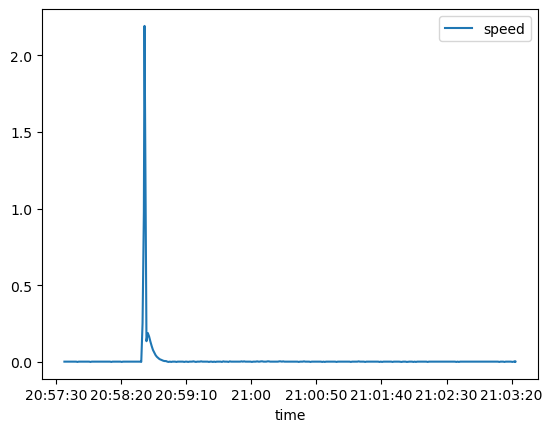

In [35]:
telemetry_data.query('objectid==1122').plot(x='time', y=['speed'])

Итак мы видим резкое возрастание скорости и её падение с очень коротким периодом торможения. Посмотрим, что нам покажут данные мгновенного расхода топлива

<Axes: xlabel='time'>

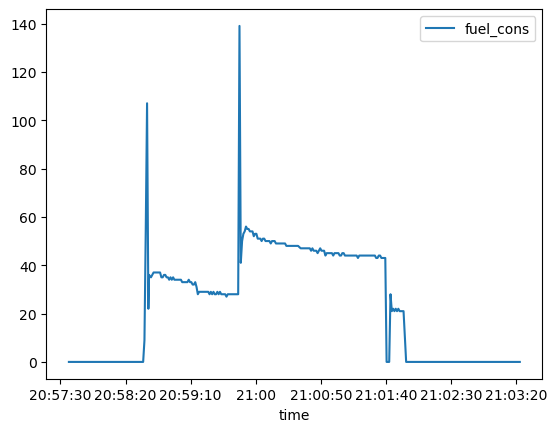

In [37]:
telemetry_data.query('objectid==1122').plot(x='time', y=['fuel_cons'])

Также мы отмечаем прыжки показаний потребления топлива, причём расход фиксируется даже в тот момент когда машина уже остановилась. По всей видимости это какие-то гидравлические эфекты.

Всё что происходило, произошло очень быстро, в течение 4 секунд. Возможно это всё-таки какие-то артифакты (Кто-то поправил положение датчика датчик и проверял систему подачи топлива).

Построим график зависимомть скорости от мгоновенного расхода. 

<Axes: xlabel='fuel_cons', ylabel='speed'>

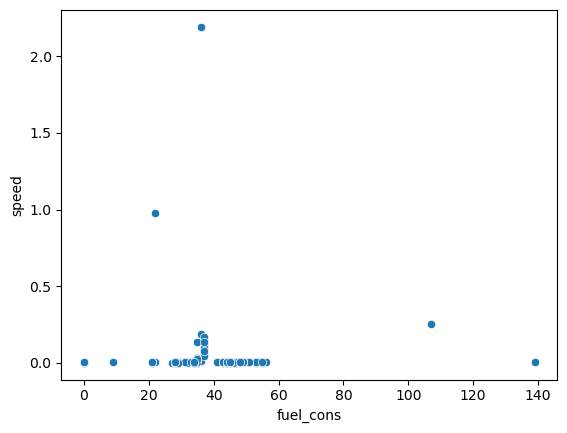

In [40]:
sns.scatterplot(data=telemetry_data.query('objectid==1122'), x='fuel_cons', y='speed')

Мы видим что зависимость как таковая не наблюдается. Поэтому мы смело можем убирать данные по самосвалу, что мы и сделаем после указания на схеме начальных координат самосвалов.

#### Отрисовка исходных местоположений грузовиков

Определим с какого момента начиналась регистрация и передача сигналов на каждом самосвале, и исходные координаты каждого самосвала, по которым построим план исходных положений машин

In [44]:
init_time=telemetry_data.groupby('objectid')['time'].min()
init_coord=telemetry_data[telemetry_data.time.isin(init_time)][['objectid', 'x', 'y']]
init_coord

,objectid,x,y
56789,1125,635231.261311,7.026633e+06
69525,1123,635791.086337,7.024396e+06
187383,1126,637769.756331,7.025924e+06
219519,1124,637529.700767,7.025990e+06
363399,1122,637916.728420,7.022312e+06
420794,1121,635217.355791,7.027060e+06


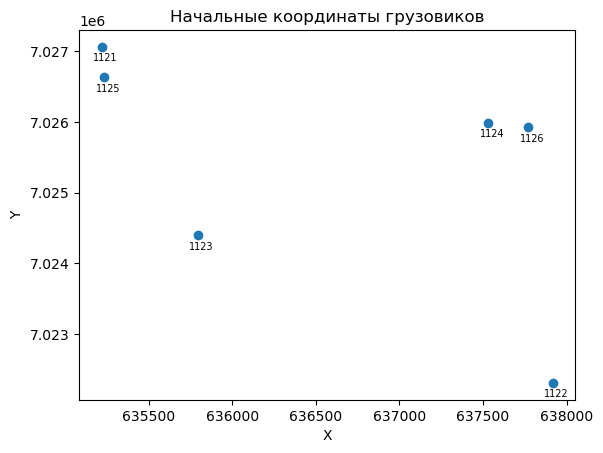

In [45]:
import matplotlib.pyplot as plt

x, y=init_coord['x'].values, init_coord['y'].values
plt.scatter(x, y)
objectid=init_coord.objectid.to_list()
objectid
for i in range(len(objectid)):
    plt.annotate(str(objectid[i]), (x[i]-50, y[i]-200), fontsize=7)
plt.title('Начальные координаты грузовиков')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

Мы видим, что машина 1122 находится на удалении от остальных машин по координате y, возможно она за пределами операционной зоны.

#### Очистка и упорядочивание данных

Мы отметили наличие в датасете данных с нулевым значением координат (самосвал с ID 1121), уберём их.

In [49]:
telemetry_data=telemetry_data[(telemetry_data.objectid!=1122) & (telemetry_data.x>0) & (telemetry_data.y>0)]

Упорядочим данные и добавим расчётныё признак расстояния (distance). Для того чтобы у нас при расчётах не перемешивались данные по самосвалам сгруппируем данные по машинам и только после этого вычмслим расстояния, построим трассировку перемешений каждой из машин, а также посмотрим  статистику для каждой машины. 


 Описание для грузовика № 1121 

<class 'pandas.core.frame.DataFrame'>
Index: 86119 entries, 420794 to 227749
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   objectid         86119 non-null  int64  
 1   time             86119 non-null  object 
 2   lat              86119 non-null  float64
 3   lon              86119 non-null  float64
 4   speed            86119 non-null  float64
 5   height           86119 non-null  float64
 6   fuel_cons        86119 non-null  float64
 7   engine_speed     0 non-null      float64
 8   hdop             86119 non-null  float64
 9   fuel_tank_level  86119 non-null  float64
 10  weight_dynamic   86119 non-null  float64
 11  tripid           86119 non-null  float64
 12  weight           86119 non-null  float64
 13  driverid         86119 non-null  float64
 14  w_fl             86119 non-null  int64  
 15  x                86119 non-null  float64
 16  y                86119 

None

,objectid,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y,distance
count,86119.00,86119.00,86119.00,86119.00,86119.00,86119.00,0.00,86119.00,86119.00,86119.00,86119.00,86119.00,86119.00,86119.00,86119.00,86119.00,86118.00
mean,1121.00,63.33,83.74,9.92,62.15,129.76,nan,92.92,46.50,95.84,1003731.19,210.10,2893.09,0.48,637141.45,7025251.96,3.77
std,0.00,0.01,0.02,10.69,165.46,153.82,nan,25.37,14.22,102.66,60.64,6.05,1.38,0.50,1115.91,1166.71,16.25
min,1121.00,63.30,83.70,0.00,-433.40,1.00,nan,0.77,14.00,0.00,1003626.00,198.00,2891.00,0.00,635087.66,7022117.76,0.00
25%,1121.00,63.33,83.72,0.01,28.90,20.00,nan,99.99,34.00,0.00,1003680.00,204.00,2891.00,0.00,636163.01,7024733.88,0.00
50%,1121.00,63.33,83.74,6.09,115.20,32.00,nan,99.99,46.00,2.00,1003728.00,212.00,2894.00,0.00,636989.60,7025536.03,0.00
75%,1121.00,63.34,83.76,17.35,162.00,300.50,nan,99.99,59.00,209.00,1003783.00,215.00,2894.00,1.00,638053.60,7026138.05,5.01
max,1121.00,63.35,83.79,48.52,309.60,415.00,nan,99.99,77.00,235.00,1003839.00,220.00,2894.00,1.00,639639.26,7027566.35,4288.47


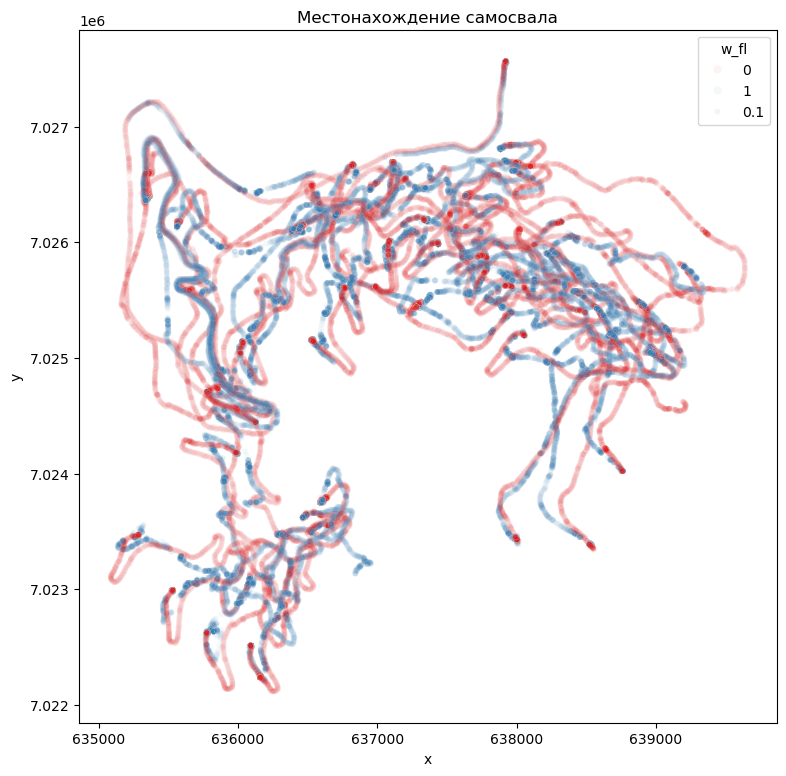

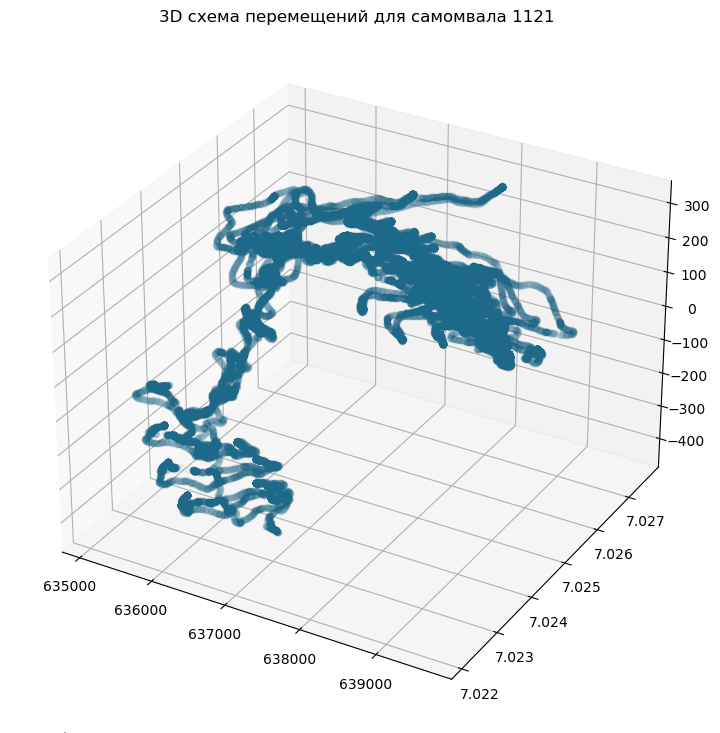

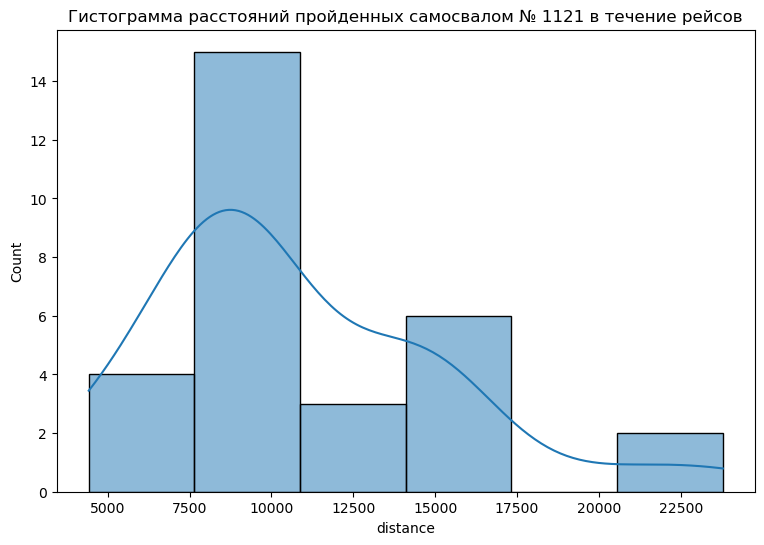


 Описание для грузовика № 1125 

<class 'pandas.core.frame.DataFrame'>
Index: 86401 entries, 56789 to 248964
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   objectid         86401 non-null  int64  
 1   time             86401 non-null  object 
 2   lat              86401 non-null  float64
 3   lon              86401 non-null  float64
 4   speed            86401 non-null  float64
 5   height           86401 non-null  float64
 6   fuel_cons        86401 non-null  float64
 7   engine_speed     86401 non-null  float64
 8   hdop             86401 non-null  float64
 9   fuel_tank_level  0 non-null      float64
 10  weight_dynamic   0 non-null      float64
 11  tripid           85893 non-null  float64
 12  weight           85893 non-null  float64
 13  driverid         85893 non-null  float64
 14  w_fl             86401 non-null  int64  
 15  x                86401 non-null  float64
 16  y                86401 n

None

,objectid,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y,distance
count,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,0.00,0.00,85893.00,85893.00,85893.00,86401.00,86401.00,86401.00,86400.00
mean,1125.00,63.34,83.75,13.72,264.88,67.57,1000.70,8.44,nan,nan,1003730.63,213.94,2888.31,0.46,637822.94,7026426.06,3.58
std,0.00,0.00,0.01,12.24,18.89,93.83,466.64,3.08,nan,nan,60.27,6.45,0.95,0.50,513.63,542.75,3.30
min,1125.00,63.33,83.70,0.00,0.00,0.00,0.00,5.00,nan,nan,1003632.00,196.00,2887.00,0.00,635203.19,7025762.65,0.00
25%,1125.00,63.34,83.75,1.20,256.00,3.30,838.25,7.00,nan,nan,1003677.00,211.00,2887.00,0.00,637597.63,7025907.84,0.42
50%,1125.00,63.34,83.75,12.70,267.00,23.30,1125.88,8.00,nan,nan,1003732.00,214.00,2889.00,0.00,637741.20,7026381.04,3.07
75%,1125.00,63.34,83.76,24.40,277.00,101.90,1273.00,9.00,nan,nan,1003781.00,219.00,2889.00,1.00,637897.06,7026816.26,6.30
max,1125.00,63.35,83.78,50.50,332.00,405.65,1839.75,86.00,nan,nan,1003837.00,227.00,2889.00,1.00,639220.29,7027611.32,24.60


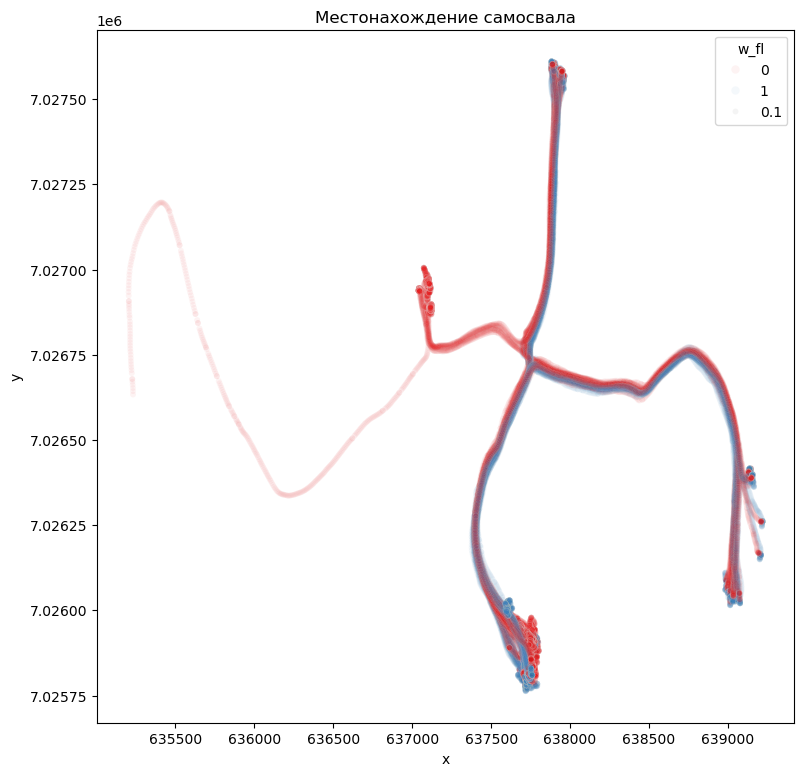

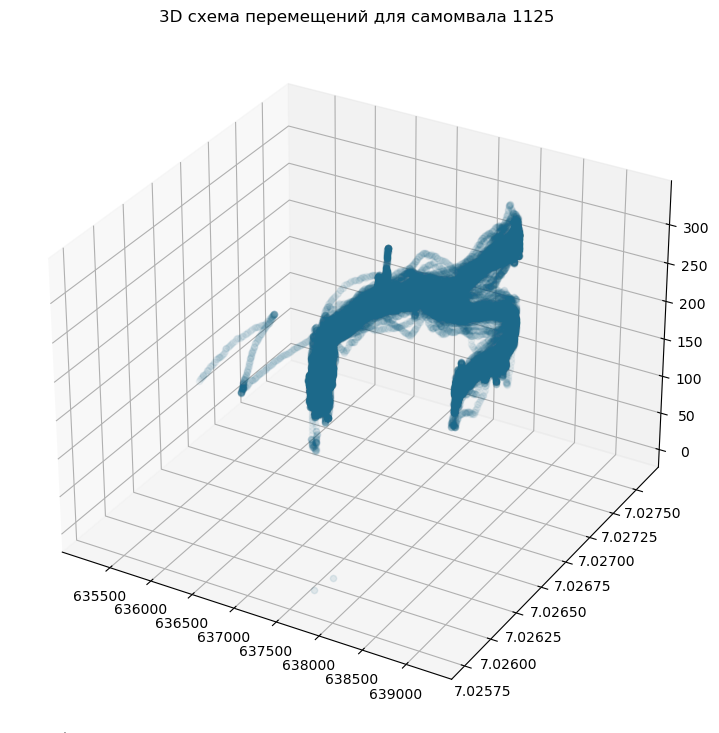

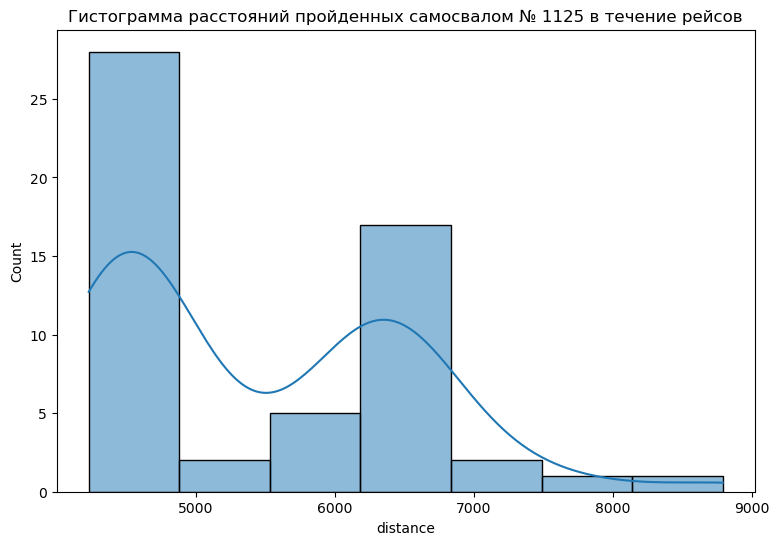


 Описание для грузовика № 1124 

<class 'pandas.core.frame.DataFrame'>
Index: 86401 entries, 219519 to 322443
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   objectid         86401 non-null  int64  
 1   time             86401 non-null  object 
 2   lat              86401 non-null  float64
 3   lon              86401 non-null  float64
 4   speed            86401 non-null  float64
 5   height           86401 non-null  float64
 6   fuel_cons        86401 non-null  float64
 7   engine_speed     86401 non-null  float64
 8   hdop             86401 non-null  float64
 9   fuel_tank_level  0 non-null      float64
 10  weight_dynamic   0 non-null      float64
 11  tripid           86306 non-null  float64
 12  weight           86306 non-null  float64
 13  driverid         86306 non-null  float64
 14  w_fl             86401 non-null  int64  
 15  x                86401 non-null  float64
 16  y                86401 

None

,objectid,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y,distance
count,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,0.00,0.00,86306.00,86306.00,86306.00,86401.00,86401.00,86401.00,86400.00
mean,1124.00,63.34,83.75,12.79,266.99,80.50,1135.72,7.04,nan,nan,1003730.85,215.31,2877.70,0.44,637877.86,7026396.38,3.27
std,0.00,0.00,0.01,12.55,12.90,99.77,272.25,1.53,nan,nan,60.36,6.36,4.12,0.50,534.78,531.46,3.35
min,1124.00,63.33,83.74,0.00,216.00,1.20,624.00,5.00,nan,nan,1003627.00,200.00,2875.00,0.00,637057.51,7025773.37,0.00
25%,1124.00,63.34,83.75,0.30,261.00,14.55,956.50,6.00,nan,nan,1003679.00,211.00,2875.00,0.00,637589.89,7025915.26,0.22
50%,1124.00,63.34,83.75,10.10,270.00,30.75,1126.38,7.00,nan,nan,1003729.00,215.00,2875.00,0.00,637740.88,7026288.09,2.31
75%,1124.00,63.34,83.76,24.80,275.00,122.95,1293.00,8.00,nan,nan,1003782.00,221.00,2884.00,1.00,637912.04,7026749.78,6.22
max,1124.00,63.35,83.78,44.00,326.00,438.40,1846.88,37.00,nan,nan,1003838.00,229.00,2884.00,1.00,639210.33,7027603.82,21.34


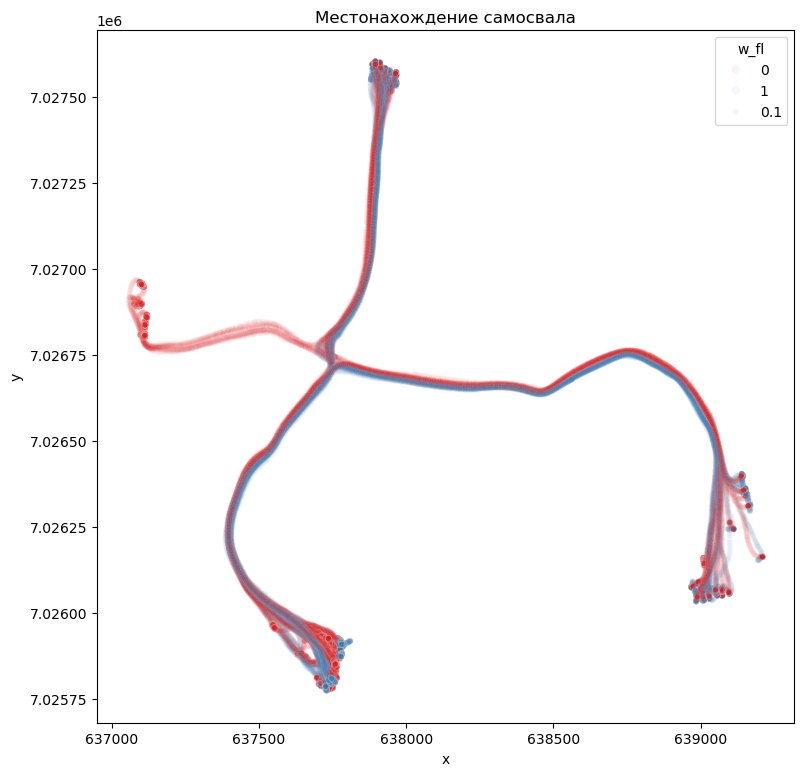

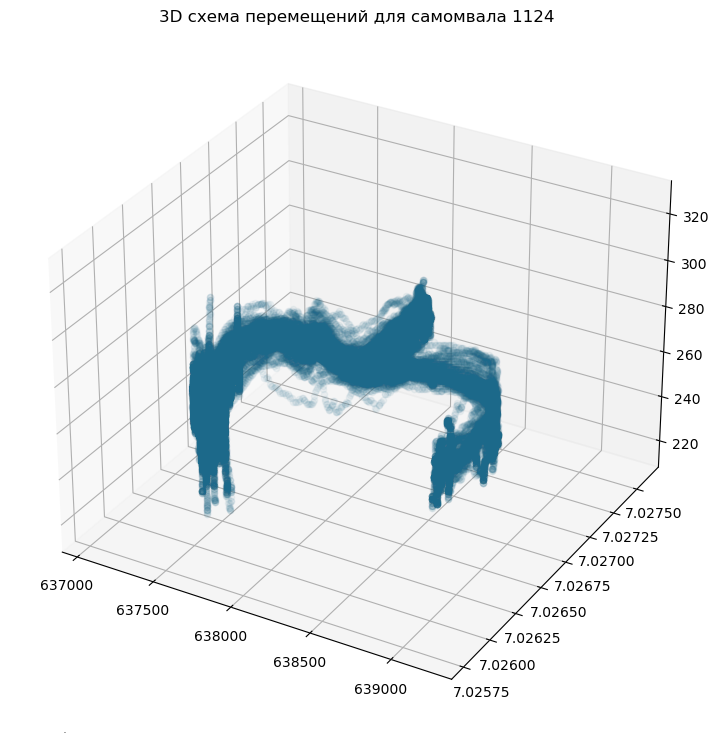

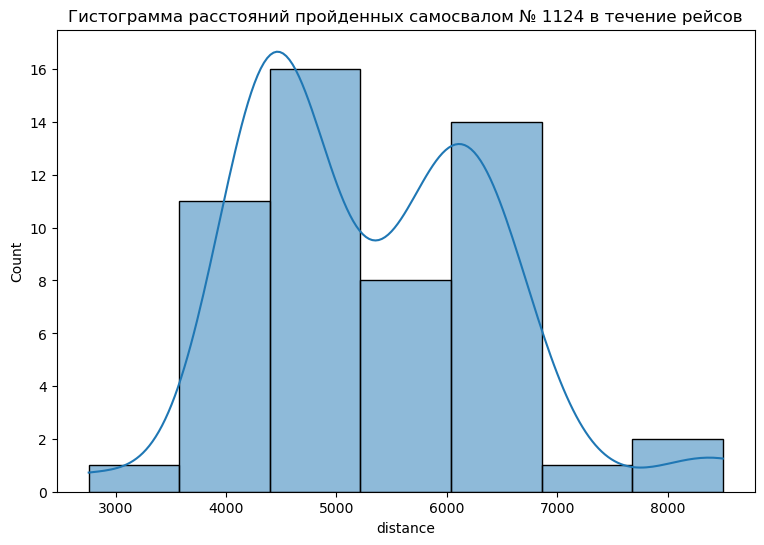


 Описание для грузовика № 1126 

<class 'pandas.core.frame.DataFrame'>
Index: 86401 entries, 187383 to 375655
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   objectid         86401 non-null  int64  
 1   time             86401 non-null  object 
 2   lat              86401 non-null  float64
 3   lon              86401 non-null  float64
 4   speed            86401 non-null  float64
 5   height           86401 non-null  float64
 6   fuel_cons        86401 non-null  float64
 7   engine_speed     86401 non-null  float64
 8   hdop             86401 non-null  float64
 9   fuel_tank_level  0 non-null      float64
 10  weight_dynamic   0 non-null      float64
 11  tripid           86401 non-null  float64
 12  weight           86401 non-null  float64
 13  driverid         86401 non-null  float64
 14  w_fl             86401 non-null  int64  
 15  x                86401 non-null  float64
 16  y                86401 

None

,objectid,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y,distance
count,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,0.00,0.00,86401.00,86401.00,86401.00,86401.00,86401.00,86401.00,86400.00
mean,1126.00,63.34,83.75,13.43,262.75,91.67,1161.57,7.58,nan,nan,1003732.13,217.24,2908.40,0.42,637833.31,7026180.12,3.45
std,0.00,0.01,0.01,13.18,22.67,108.71,264.69,1.83,nan,nan,60.90,6.90,0.92,0.49,586.83,1003.18,4.20
min,1126.00,63.30,83.70,0.00,79.00,0.00,647.00,5.00,nan,nan,1003628.00,201.00,2907.00,0.00,635188.92,7022220.68,0.00
25%,1126.00,63.34,83.75,0.70,257.00,35.40,1093.00,6.00,nan,nan,1003676.00,212.00,2907.00,0.00,637584.37,7025873.92,0.15
50%,1126.00,63.34,83.75,10.00,268.00,36.55,1100.00,7.00,nan,nan,1003731.00,217.00,2909.00,0.00,637743.98,7026231.12,0.90
75%,1126.00,63.34,83.76,26.20,275.00,132.65,1299.00,8.00,nan,nan,1003784.00,223.00,2909.00,1.00,637933.18,7026710.65,6.42
max,1126.00,63.35,83.78,46.40,312.00,441.90,1874.00,41.00,nan,nan,1003840.00,231.00,2909.00,1.00,639245.99,7027608.85,24.80


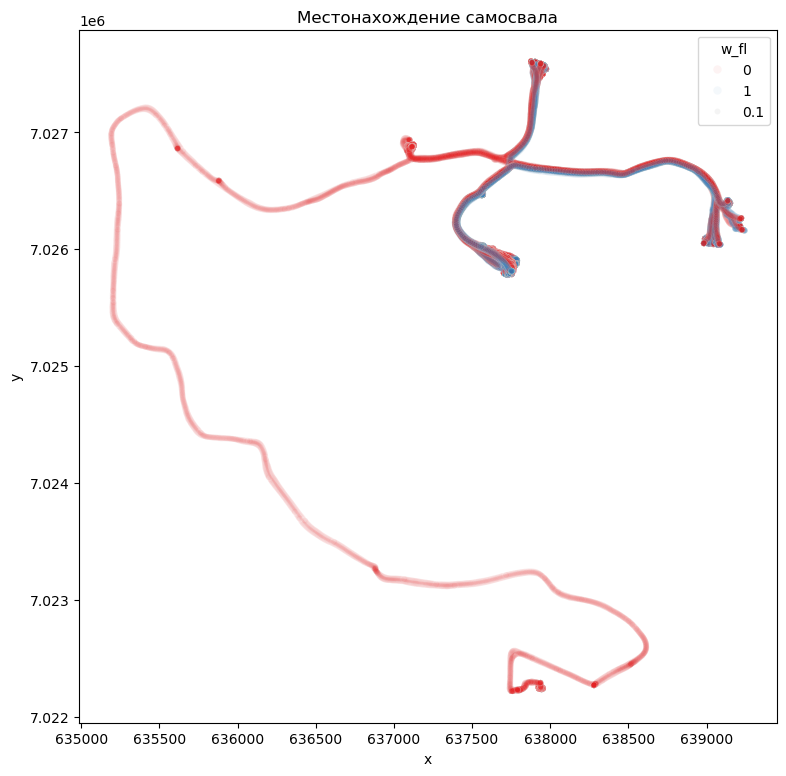

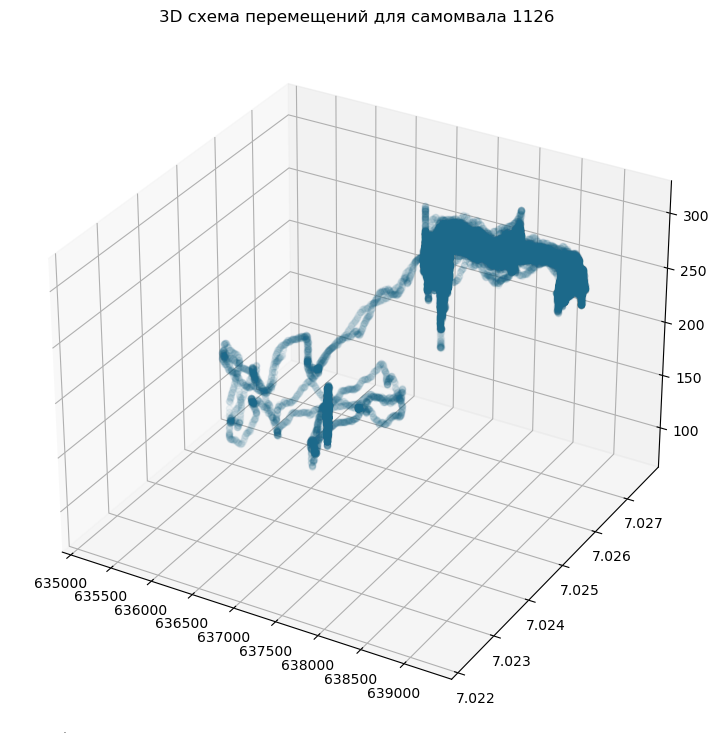

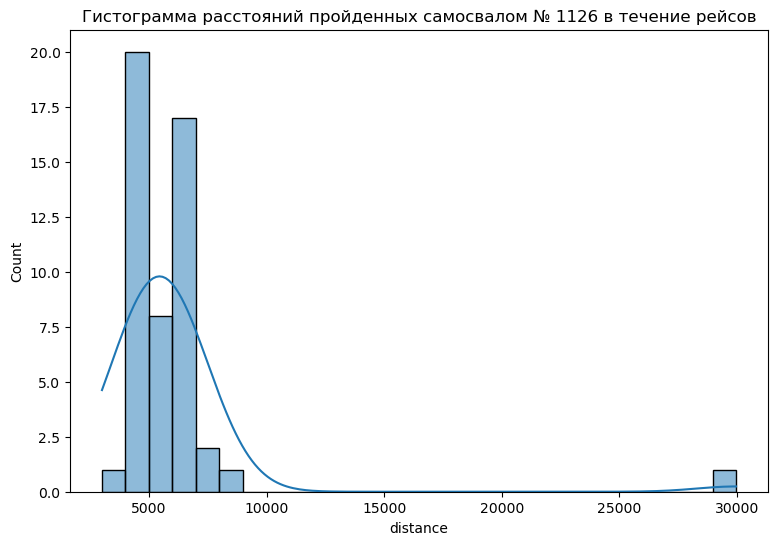


 Описание для грузовика № 1123 

<class 'pandas.core.frame.DataFrame'>
Index: 80638 entries, 69525 to 117909
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   objectid         80638 non-null  int64  
 1   time             80638 non-null  object 
 2   lat              80638 non-null  float64
 3   lon              80638 non-null  float64
 4   speed            80638 non-null  float64
 5   height           80638 non-null  float64
 6   fuel_cons        80638 non-null  float64
 7   engine_speed     0 non-null      float64
 8   hdop             80638 non-null  float64
 9   fuel_tank_level  80638 non-null  float64
 10  weight_dynamic   80638 non-null  float64
 11  tripid           80638 non-null  float64
 12  weight           80638 non-null  float64
 13  driverid         80638 non-null  float64
 14  w_fl             80638 non-null  int64  
 15  x                80638 non-null  float64
 16  y                80638 n

None

,objectid,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y,distance
count,80638.00,80638.00,80638.00,80638.00,80638.00,80638.00,0.00,80638.00,80638.00,80638.00,80638.00,80638.00,80638.00,80638.00,80638.00,80638.00,80637.00
mean,1123.00,63.34,83.71,16.34,90.71,137.24,nan,2.47,49.59,96.75,1003728.11,211.80,2886.60,0.48,635851.73,7025813.93,4.95
std,0.00,0.01,0.01,13.09,74.32,160.35,nan,9.82,15.46,103.70,60.29,6.30,11.51,0.50,648.87,968.21,11.15
min,1123.00,63.31,83.70,0.00,-22.50,1.00,nan,0.61,12.00,0.00,1003629.00,195.00,2878.00,0.00,635185.16,7023437.18,0.00
25%,1123.00,63.33,83.70,0.03,30.30,16.00,nan,1.03,38.00,0.00,1003678.00,210.00,2878.00,0.00,635340.59,7024801.96,0.00
50%,1123.00,63.34,83.71,15.93,73.80,29.00,nan,1.25,48.00,1.00,1003727.00,213.00,2878.00,0.00,635689.38,7026337.95,5.01
75%,1123.00,63.34,83.72,27.97,136.80,359.00,nan,1.64,58.00,211.00,1003780.00,216.00,2902.00,1.00,636136.59,7026507.13,11.14
max,1123.00,63.35,83.76,45.04,282.00,441.00,nan,99.99,100.00,249.00,1003841.00,222.00,2902.00,1.00,637951.52,7027598.89,1283.49


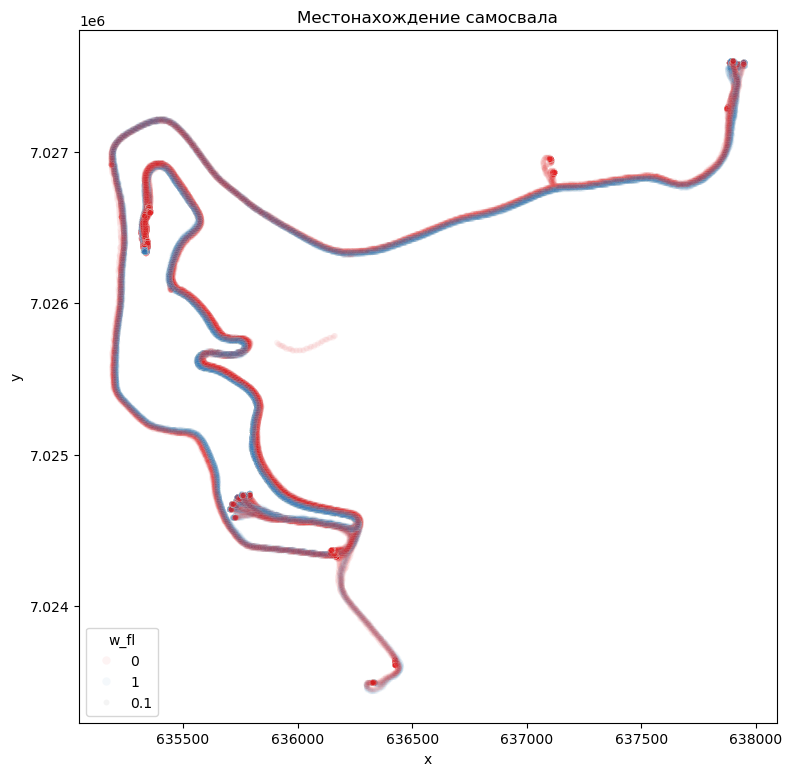

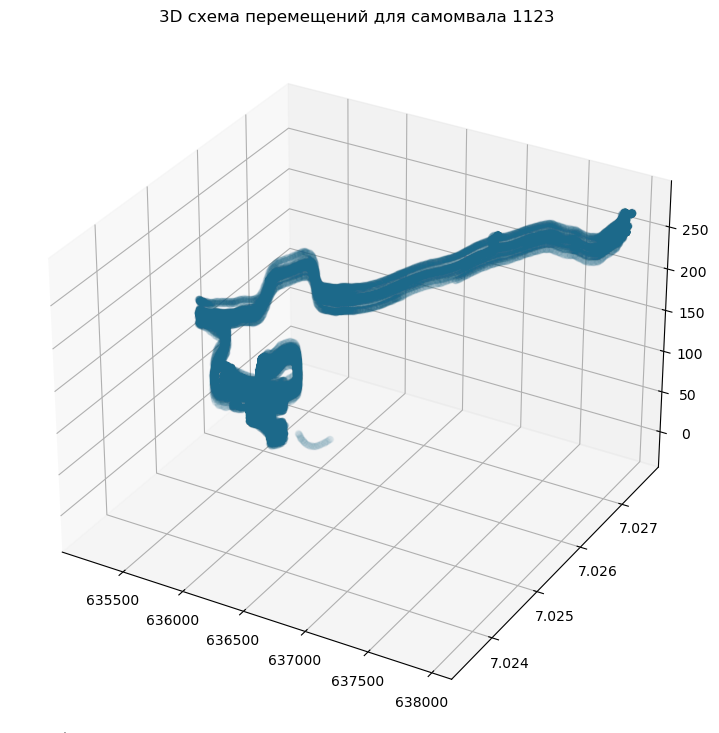

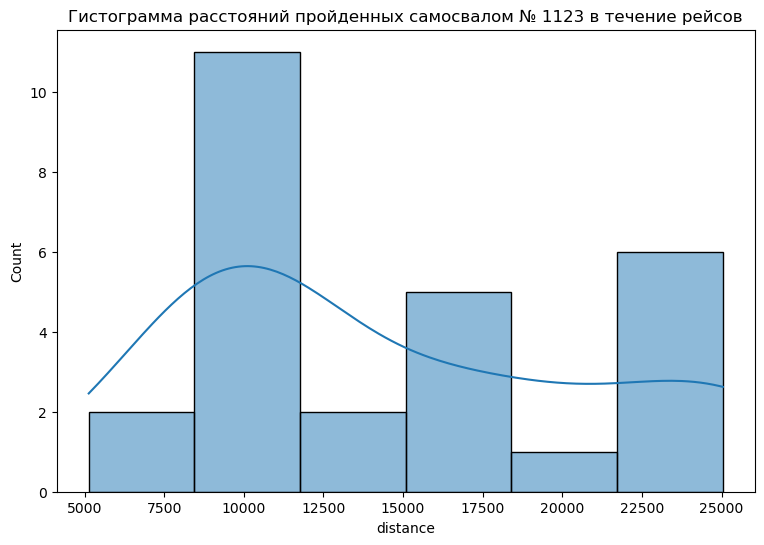

In [51]:
truck_dict=dict()

for truck in telemetry_data.objectid.unique():
    truck_dict[truck]=telemetry_data[telemetry_data.objectid==truck]

for key in truck_dict.keys():
    truck_data=truck_dict[key]
    truck_data.sort_values(by=['tripid', 'time'], inplace=True)
    truck_data.loc[:,'distance']=np.sqrt(truck_data.x.diff()**2+truck_data.y.diff()**2)
    print('\n', f'Описание для грузовика № {key}', '\n')
    display(truck_data.info())
    display(truck_data.describe().applymap("{0:.2f}".format))
    plot_dump_truck_locations(truck_data)
    fig = plt.figure(figsize=(9.0, 9.0)) 
    ax = fig.add_subplot(projection='3d') 
    ax.scatter(truck_data.x, truck_data.y, truck_data.height, c='#1c698a', depthshade=False, alpha=0.05) 
    plt.title(f'3D схема перемещений для самомвала {key}')
    plt.show()
    fig = plt.figure(figsize=(9.0, 6.0)) 
    sns.histplot(truck_data.groupby('tripid')['distance'].sum(), kde=True)
    plt.title(f'Гистограмма расстояний пройденных самосвалом № {key} в течение рейсов')
    plt.show()

Мы приходим к интересным выводам:

1. Маршруты самосвалов 1124-1126 практически неизменны меняются только локальные позиции разгрузки/погрузки и локации точек одинаковы
2. Для машины 1123 также характерен постоянный маршрут для всех рейсов, но он отличается от маршрута для первых 3-х машин. 
3. Для 1121 системы в перемещениях не просматривается, и она по всей видимости обслуживает не только основные точки погрузхки выгрузки, но и множество других точек.

Повторно объединяем подсеты в единый датасет

In [54]:
telemetry_data=pd.concat(truck_dict.values())

Построим 3-хмерные карты с использованием Plotly  и Matplotlib

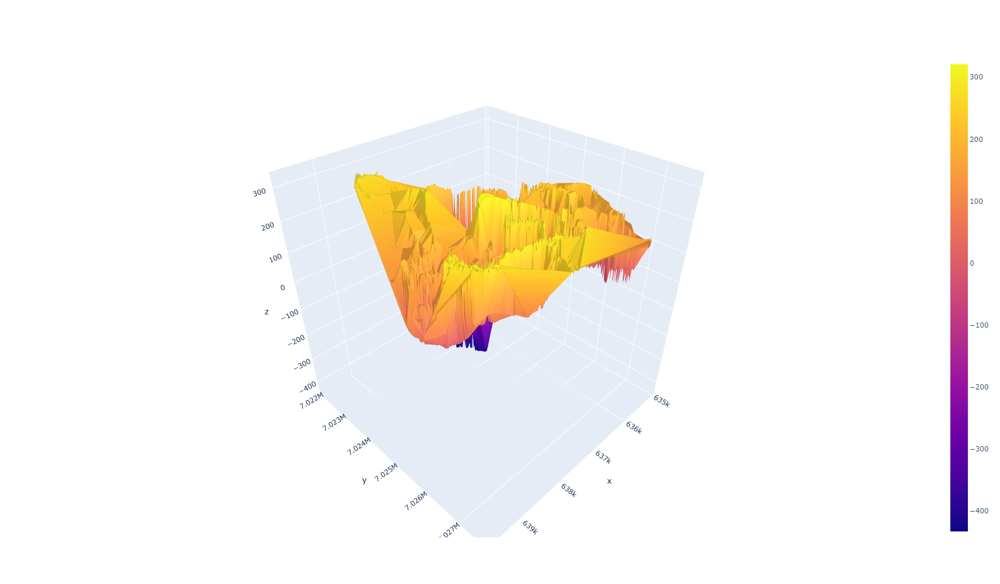

In [56]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.interpolate import griddata

x, y, z= telemetry_data['x'], telemetry_data['y'], telemetry_data['height']
xi = np.linspace(x.min(), x.max(), 500)
yi = np.linspace(y.min(), y.max(), 500)
X,Y = np.meshgrid(xi,yi)
Z = griddata((x,y),z,(X,Y))


fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.update_layout(width=1000, height=1000)

fig.show()

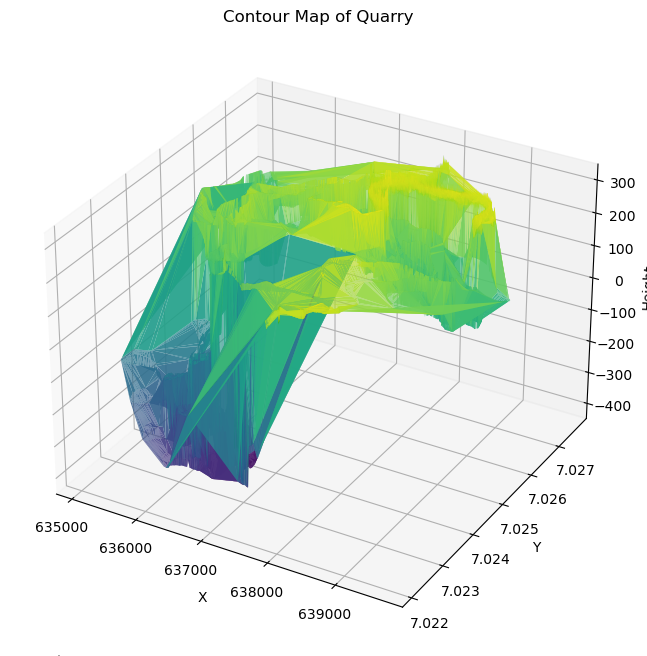

In [57]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(telemetry_data['x'], telemetry_data['y'], telemetry_data['height'], cmap='viridis', edgecolor='none', alpha=0.9)
ax.set_title('Contour Map of Quarry')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Height')
plt.show()

Определяем количество рейсов и средние пройденные за один рейс расстояния для самосвалов

In [59]:
def movement_calculations(data):
    trip_num_by_truck=data.groupby('objectid')['tripid'].nunique() # Количество рейсов за сутки
    full_dist_by_truck=data.groupby(['objectid'])['distance'].sum() # Суммарные расстояние пройденные грузовиками за период измерения (~ 24 часа).
    trucks_move=pd.merge(trip_num_by_truck, full_dist_by_truck, left_index=True, right_index=True)
    trucks_move.columns=['trips qty', 'distance']
    trucks_move['move']=(trucks_move['distance']/trucks_move['trips qty']).round(0)
    trucks_move['total_time']=data.groupby('objectid')['time'].agg(['min', 
                                                                    'max']).diff(axis=1).iloc[:,1].apply(lambda x: 
                                                                                                         x.total_seconds())/3600 #время регистрации телеметрируемых данных для каждой машины
    trucks_move['average speed']=trucks_move.distance/(trucks_move.total_time*1000)
    return trucks_move.round(2)

In [60]:
movement_calculations(telemetry_data)

,trips qty,distance,move,total_time,average speed
objectid,,,,,
1121,30,324871.16,10829.0,24.00,13.54
1123,27,399006.77,14778.0,23.98,16.64
1124,53,282483.77,5330.0,24.00,11.77
1125,56,308900.68,5516.0,24.00,12.87
1126,50,298056.67,5961.0,24.00,12.42


Мы видим что за рейс машины №№ 1121 и 1123, за один рейс проходят больший путь чем три остальных самосвала. По всей видимости у них разные функции, и с этим может быть связана их экипировка средствами телеметрии.

Ранее делалось предположение о параметре w_fl. Проверим их, для эьтого визуализируем местоположения с цветовой кодировкой w_fl

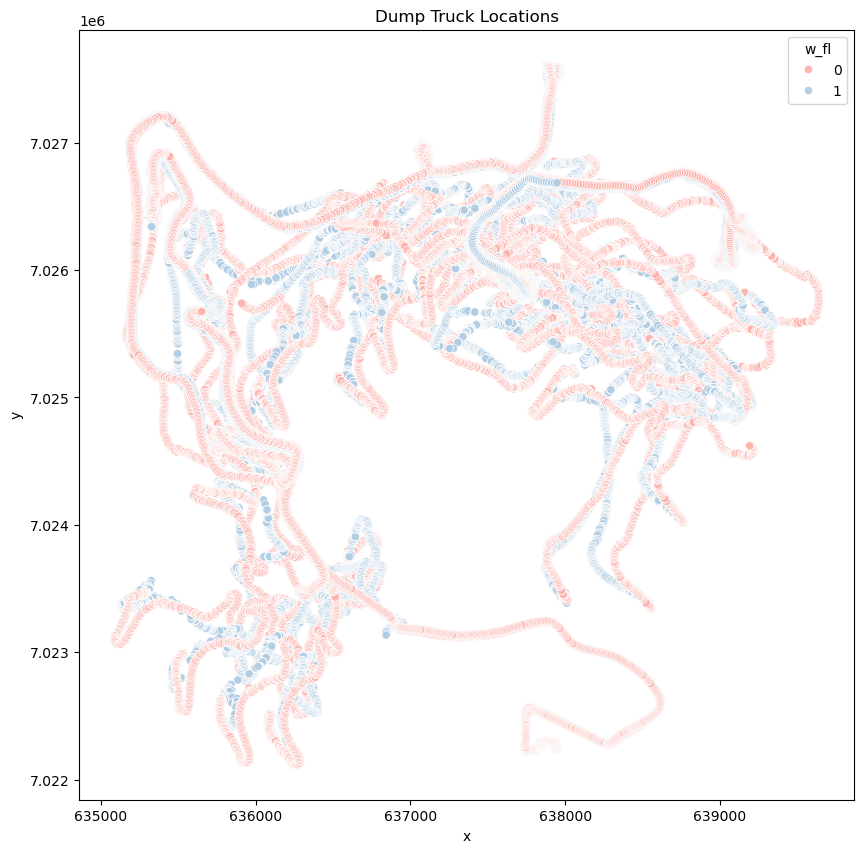

In [63]:
plt.figure(figsize=[10, 10])
sns.scatterplot(data=telemetry_data, x='x', y='y',
                hue='w_fl', 
                palette='Pastel1',
                
               )
plt.xlabel('x')
plt.ylabel('y')
plt.title('Dump Truck Locations')
plt.show()
 

Мы видим что все синие и красные линии кроме одной доходят до определённой точки, откуда уже идёт синяя линия. Таким образом наша гипотеза о том что параметр w_fl
соответствует движению к месту погрузки и от него. Сгруппируем записи по значениям этого признака и выяясним имеются ли различия в медианных згачений других признаков в этих группах.

In [65]:
w_fl_classes=telemetry_data.groupby('w_fl')
w_fl_classes.median()

,objectid,time,lat,lon,speed,height,fuel_cons,engine_speed,hdop,fuel_tank_level,weight_dynamic,tripid,weight,driverid,x,y,distance
w_fl,,,,,,,,,,,,,,,,,
0,1124.0,2023-11-08 12:02:09.105999872+07:00,63.337055,83.749339,6.26439,252.0,27.75,1117.375,7.0,48.0,0.0,1003732.0,214.0,2889.0,637621.841420,7.026109e+06,0.610922
1,1124.0,2023-11-08 11:30:30.060999936+07:00,63.336837,83.751084,13.54740,257.0,55.30,1128.500,7.0,47.0,210.0,1003727.0,214.0,2889.0,637713.934161,7.026078e+06,3.245952


Мы видим, что в классе 1 более высокий расход топлива, вес грузовика. Всё это похоже на передвижения груженного грузовика, а в классе 0 получается, находится телеметрия по порожней машине

In [67]:
# plt.figure(figsize=[10, 10])
# sns.scatterplot(data=data, x='x', y='y', hue='objectid', palette='tab10', markers='*')
# plt.xlabel('x')
# plt.ylabel('y')
# plt.title('Dump Truck Locations')
# plt.show()
 

Перед тем как продолжить исследование данных, посмотрим, наблюдается ли корреляция между признаками и как они распределены.

## Задание 2

Все пункты делаются на данных, оставшихся после чистки в Задании 1. Правильных ответов (по числам) нет, т к препроцессинг может отличаться. Нам интересно увидеть, как Вы это делаете.
* Вывести средние значения параметров ['hdop', 'speed', 'engine_speed', 'DQ_vertical_bump', 'height'] по самосвалам
* Построить гистограмму суммарных расстояний за каждый рейс.
* Вывести таблицу средних скоростей самосвалов за каждый час суток (формат: колонки - час суток, строки - самосвалы, в ячейках - средняя скорость)
* Выбрать по одному рейсу для каждого самосвала. Для каждого рейса: нарисовать его на общей карте карьера, нарисовать на одном графике кривую изменения скорости от времени и высоты от времени (шкалы должны быть на разных осях).
* Присоединить данные погоды к данным телеметрии

Посмотрим как менялась высота за время работы каждой машины


	 Суточная альтиметрия по самосвалу № 1121


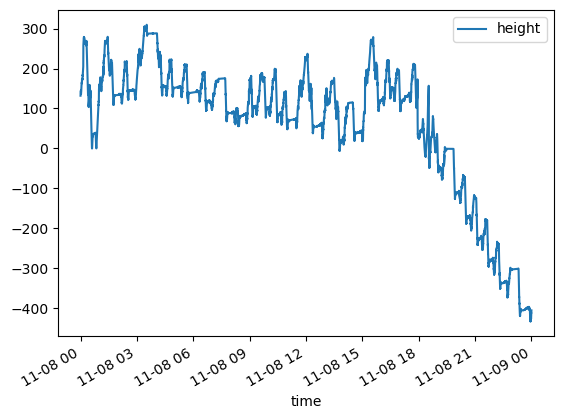


	 Суточная альтиметрия по самосвалу № 1125


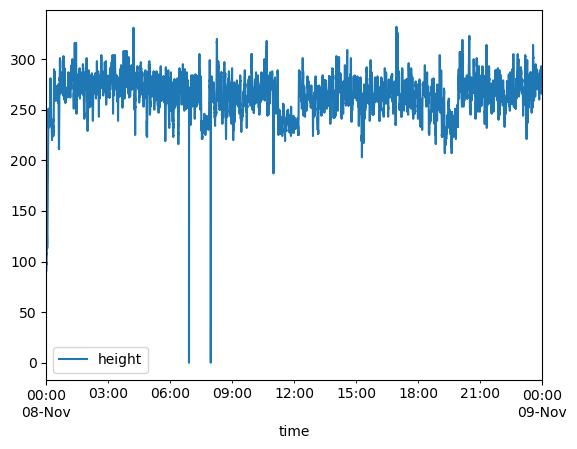


	 Суточная альтиметрия по самосвалу № 1124


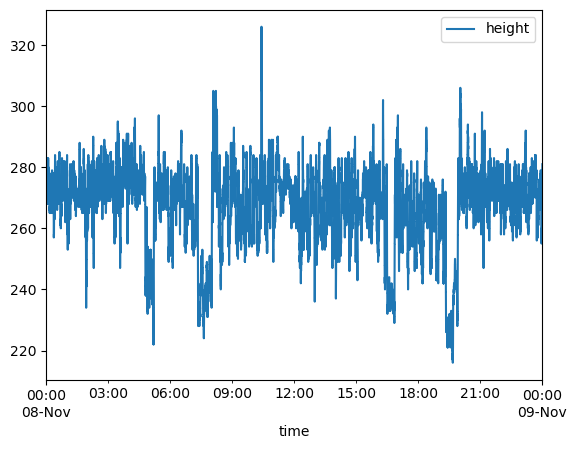


	 Суточная альтиметрия по самосвалу № 1126


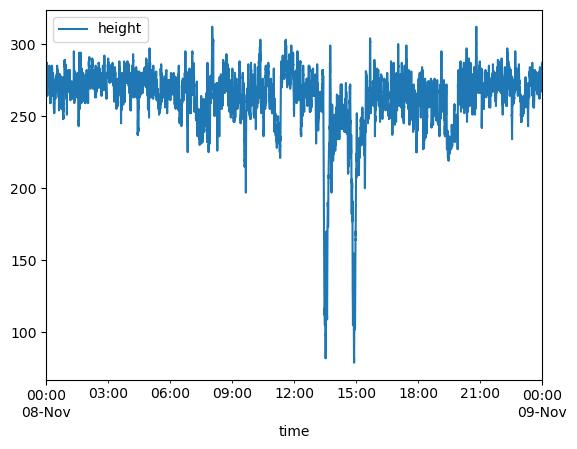


	 Суточная альтиметрия по самосвалу № 1123


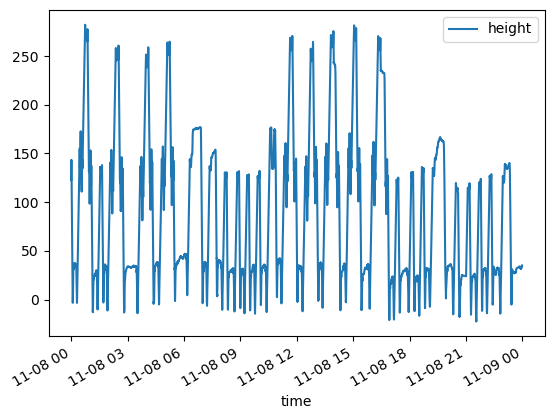

In [71]:
for i in telemetry_data.objectid.unique():
    print("\n\t", '\033[1m' f'Суточная альтиметрия по самосвалу № {i}' '\033[1m')
    telemetry_data[telemetry_data.objectid==i].plot(x='time', y=['height'])
    plt.show()

Мы видим что:

1. Для датчика 1121 данные выяглядят нормально до момента времени 11-08 18, после чего они уходят в линейное пике и принимают большие отрицательные значение. Если машина не уехала в пропасть, возможно какая-то проблема с датчиками. Удалим все отрицательные значения высот, у остальных грузовиков такие провалы отсутствуют

2. У датчика 1125 фиксируются два момента падения сигнала до 0, возможно также сбои представляют выбросные значения, и поскольку их мало, мы можем их удалить

3. Также аномально резкое и интенсивное смещение в двух эпизодах наблюдается у датчика 1126

4. Датчик 1123 работает очень странно себя ведёт, наблюдается зубчатая альтиграмма с узкими пиками и постоянными прыхками от 250 м до нулевой отметки.

Посмотрим как меняется скорость от машины к машине и по часам

In [74]:
telemetry_data['hour']=telemetry_data.time.apply(lambda x: x.hour) 
speed_by_truck_and_hour=telemetry_data.groupby(['objectid', 'hour']).speed.mean().unstack()
speed_by_truck_and_hour.T.round(2)

objectid,1121,1123,1124,1125,1126
hour,,,,,
0,18.47,22.36,19.36,13.20,17.66
1,12.86,18.71,15.55,17.69,18.09
2,8.24,21.40,17.29,17.94,15.32
3,6.41,11.88,10.59,16.95,12.42
4,13.87,21.85,14.06,17.86,17.38
5,5.95,15.33,12.23,15.31,15.64
6,7.55,9.89,14.29,13.48,14.82
7,4.96,11.87,5.92,11.31,6.68
8,7.18,16.24,11.25,13.15,13.04


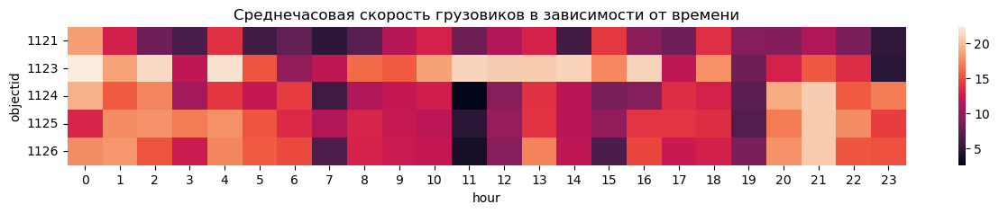

In [75]:
plt.figure(figsize=[15, 2])

sns.heatmap(speed_by_truck_and_hour)
plt.title('Среднечасовая скорость грузовиков в зависимости от времени')
plt.yticks(rotation=0)
plt.show()

In [76]:
# plt.figure(figsize=[15, 2])
# distance_by_truck_and_hour=telemetry_data.groupby(['objectid', 'hour']).distance.sum().unstack()/1000
# sns.heatmap(distance_by_truck_and_hour)
# plt.title('Перемещение за час по часам')
# plt.yticks(rotation=0)
# plt.show()

In [77]:
avdist_df=pd.DataFrame([truck_dict.keys(), truck_dict.values()]).T

Сопоставим графики изменени скорости высоты для произвольного рейса одной из машин

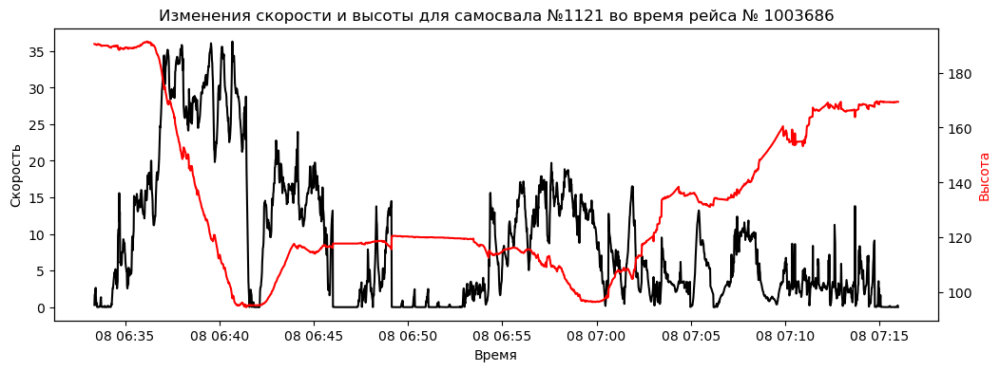

In [79]:
truck_1221=telemetry_data.loc[(telemetry_data.objectid==1121) 
& (telemetry_data.tripid==1003686.)]
x1, y1, y2 =truck_1221[['time', 'speed', 'height']].T.values
fig, ax1 = plt.subplots(figsize=[12, 4])
ax2 = ax1.twinx()
ax1.plot(x1, y1, 'k-')
ax2.plot(x1, y2, 'r-')
plt.title('Изменения скорости и высоты для самосвала №1121 во время рейса № 1003686')
ax1.set_xlabel('Время')
ax1.set_ylabel('Скорость', color='k')
ax2.set_ylabel('Высота', color='r')
plt.show()

Загрузим теперь данные по погоде и посмотрим их

In [81]:
# Load weather data
weather_data = pd.read_parquet('weather_hourly.parquet')
weather_data.head(5)  

,time,precipIntensity,precipProbability,temperature,apparentTemperature,dewPoint,humidity,pressure,windSpeed,windGust,windBearing,cloudCover,visibility,precipType,rain,snow,no_weather_info
0,2023-11-07 20:00:00+00:00,0.0,0.0,-13.27,-20.02,-17.59,67.0,1027.0,3.48,8.91,60.0,100.0,10000.0,clouds,0,0,1
1,2023-11-08 06:00:00+00:00,0.0,0.0,-9.27,-15.79,-16.07,54.0,1020.0,4.13,8.20,71.0,100.0,10000.0,clouds,0,0,1
2,2023-11-07 18:00:00+00:00,0.0,0.0,-13.27,-20.10,-17.59,67.0,1028.0,3.55,8.92,62.0,95.0,10000.0,clouds,0,0,1
3,2023-11-07 16:00:00+00:00,0.0,0.0,-13.27,-19.67,-17.44,68.0,1030.0,3.18,7.71,61.0,94.0,10000.0,clouds,0,0,1
4,2023-11-07 11:00:00+00:00,0.0,0.0,-10.27,-16.63,-14.37,69.0,1033.0,3.72,9.60,64.0,65.0,10000.0,clouds,0,0,1


In [82]:
weather_data.shape

(55, 17)

In [83]:
print('\n', telemetry_data.columns, '\n\n', weather_data.columns)


 Index(['objectid', 'time', 'lat', 'lon', 'speed', 'height', 'fuel_cons',
       'engine_speed', 'hdop', 'fuel_tank_level', 'weight_dynamic', 'tripid',
       'weight', 'driverid', 'w_fl', 'x', 'y', 'distance', 'hour'],
      dtype='object') 

 Index(['time', 'precipIntensity', 'precipProbability', 'temperature',
       'apparentTemperature', 'dewPoint', 'humidity', 'pressure', 'windSpeed',
       'windGust', 'windBearing', 'cloudCover', 'visibility', 'precipType',
       'rain', 'snow', 'no_weather_info'],
      dtype='object')


In [84]:
weather_data.agg(['nunique', 'dtypes'])

,time,precipIntensity,precipProbability,temperature,apparentTemperature,dewPoint,humidity,pressure,windSpeed,windGust,windBearing,cloudCover,visibility,precipType,rain,snow,no_weather_info
nunique,55,8,16,16,51,45,28,19,48,46,37,9,18,2,1,2,1
dtypes,"datetime64[ns, UTC]",float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,int64,int64,int64


Смотрим данные у нас два константных и два бинарных значения. Избавляемся от константных значений и смотрим что собой представляют бинарные

In [86]:
weather_data[['precipType', 'snow']].value_counts().unstack().fillna(0)

snow,0,1
precipType,,
clouds,41.0,0.0
snow,0.0,14.0


Мы видим что имеет место полная идентичность признаков snow и precipType, и учитывая отсутствия дождя понятно почему этот признак у нас бинарен (при дожде было бы 3 класса)

In [88]:
# weather_data.drop(['no_weather_info', 'rain', 'precipType'], axis=1, inplace=True)
weather_data.sort_values('time', inplace=True)
weather_data.time=pd.to_datetime(weather_data.time)
telemetry_data.time=pd.to_datetime(telemetry_data.time)

In [89]:
merged=pd.merge(telemetry_data, weather_data, how='left', on='time')
merged.columns

Index(['objectid', 'time', 'lat', 'lon', 'speed', 'height', 'fuel_cons',
       'engine_speed', 'hdop', 'fuel_tank_level', 'weight_dynamic', 'tripid',
       'weight', 'driverid', 'w_fl', 'x', 'y', 'distance', 'hour',
       'precipIntensity', 'precipProbability', 'temperature',
       'apparentTemperature', 'dewPoint', 'humidity', 'pressure', 'windSpeed',
       'windGust', 'windBearing', 'cloudCover', 'visibility', 'precipType',
       'rain', 'snow', 'no_weather_info'],
      dtype='object')

In [90]:
merged.drop(['x', 'y', 'tripid'], axis=1, inplace=True) # у нас имеются данные по широте долготе, мы будем использовать их.
merged.sort_values('time', ascending=True, inplace=True)

In [91]:
merged.columns.sort_values()

Index(['apparentTemperature', 'cloudCover', 'dewPoint', 'distance', 'driverid',
       'engine_speed', 'fuel_cons', 'fuel_tank_level', 'hdop', 'height',
       'hour', 'humidity', 'lat', 'lon', 'no_weather_info', 'objectid',
       'precipIntensity', 'precipProbability', 'precipType', 'pressure',
       'rain', 'snow', 'speed', 'temperature', 'time', 'visibility', 'w_fl',
       'weight', 'weight_dynamic', 'windBearing', 'windGust', 'windSpeed'],
      dtype='object')

In [92]:
# Заполняем пропуски по погодным данным, создаём признак минут, удаляем лишнее 
merged[['precipIntensity', 'precipProbability', 'temperature',
       'apparentTemperature', 'dewPoint', 'humidity', 'pressure', 'windSpeed',
       'windGust', 'windBearing', 'cloudCover', 'visibility', 'snow']]=merged[['precipIntensity', 'precipProbability', 'temperature',
       'apparentTemperature', 'dewPoint', 'humidity', 'pressure', 'windSpeed',
       'windGust', 'windBearing', 'cloudCover', 'visibility', 'snow']].fillna(method='ffill')
merged.isna().sum()

objectid                    0
time                        0
lat                         0
lon                         0
speed                       0
height                      0
fuel_cons                   0
engine_speed           166757
hdop                        0
fuel_tank_level        259203
weight_dynamic         259203
weight                    603
driverid                  603
w_fl                        0
distance                    5
hour                        0
precipIntensity             0
precipProbability           0
temperature                 0
apparentTemperature         0
dewPoint                    0
humidity                    0
pressure                    0
windSpeed                   0
windGust                    0
windBearing                 0
cloudCover                  0
visibility                  0
precipType             425885
rain                   425885
snow                        0
no_weather_info        425885
dtype: int64

In [93]:
merged['minute']=merged.time.dt.minute
merged.drop('time', axis=1, inplace=True)
# merged.agg(['nunique', 'dtypes']).T


Преобразуем признак часа и признак ID водителя

In [95]:
merged_bin=pd.get_dummies(merged[['driverid', 'hour']], columns=['driverid', 'hour'])
merged_bin.columns

Index(['driverid_2875.0', 'driverid_2878.0', 'driverid_2884.0',
       'driverid_2887.0', 'driverid_2889.0', 'driverid_2891.0',
       'driverid_2894.0', 'driverid_2902.0', 'driverid_2907.0',
       'driverid_2909.0', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4',
       'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11',
       'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17',
       'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23'],
      dtype='object')

Проведём нормализацию остальных признаков и посмотрим как они коррелированы и какому закону распледеления следуют

In [97]:
merged_mul=merged[merged.columns[merged.nunique()>2]]
merged_mul.columns

Index(['objectid', 'lat', 'lon', 'speed', 'height', 'fuel_cons',
       'engine_speed', 'hdop', 'fuel_tank_level', 'weight_dynamic', 'weight',
       'driverid', 'distance', 'hour', 'temperature', 'apparentTemperature',
       'dewPoint', 'humidity', 'pressure', 'windSpeed', 'windGust',
       'windBearing', 'minute'],
      dtype='object')

In [98]:
# def Normality_checker(feature, methods):
#     test_dict=dict()
#     for i in [*methods]:        
#         if i=='shapiro':
#             test_dict['shapiro']=shapiro(feature)
#         if i=='normaltest':
#             test_dict['normaltest']=normaltest(feature)
#     return test_dict    

In [99]:
def distexaminer(feature, method="IQR", IQR_cf=[1.5, 1.5], Sigma_cf=[3, 3], Nbest=3, verbose=2):
    ollist=[]
    print("\033[2m" + feature.name.upper().center(79, '*') +"\033[0;0m")
    plt.figure(figsize=[6.5, 1.75])
    f=Fitter(feature.T, bins=20) 
    f.distributions=['norm', 'gamma', 'logistic', 'lognorm', 'expon', 'exponnorm', 'uniform']
    f.fit()      
    display(f.summary(Nbest=Nbest).round(3).drop('kl_div', axis=1))
    plt.show() 
    ol=Outlier_hunter(feature, method=method, IQR_cf=IQR_cf, Sigma_cf=Sigma_cf, verbose=verbose)
    plt.show()
    if ol is None:
        return
    else:
        return ol

def Outlier_hunter(feature, method, IQR_cf=[1.5, 1.5], Sigma_cf=[3, 3], verbose=2):
    """Модуль поиска выбросов методами межквартильных размахов и сигма"""
    outliers_dict=dict()
    # outliers_list=[]
    stat=feature.T.describe()
    rstat=stat[['mean', 'std', '25%', '50%', '75%']]
    vrange=list(stat[['min', 'max']].round(2))
    if method=='IQR':
        IQR=rstat[4]-rstat[2]
        LL=round(rstat[2]-IQR_cf[0]*IQR, 2)
        RL=round(rstat[4]+IQR_cf[1]*IQR, 2)
        limits=[LL, RL]
        outliers=feature[~feature.between(*limits)]
        opct_iqr=round((len(outliers)/feature.shape[0]), 4)
        if verbose>=2:
            print('* IQR method with IQR coeff. values: {} is {} which amounts {} %'.format(IQR_cf, len(outliers), round(opct_iqr*100),3))    
    elif method=='Sigma':
        LS=rstat[0]-Sigma_cf[0]*rstat[1]        
        RS=rstat[0]+Sigma_cf[1]*rstat[1]   
        limits=[LS, RS]
        outliers=feature[~feature.between(*limits)]
        opct_z=round((len(outliers)/feature.shape[0]), 4) 
        if verbose>=2:
            print('* Z-score method with sigma coeff. values: {} is {} which amounts {} %'.format(Sigma_cf, len(outliers), round(opct_z*100),3))           
    if verbose>=1:
        if feature.min()<min(limits) or feature.max()>max(limits): 
            plt.figure(figsize=[7, 0.15])
            sns.boxplot(x=feature, orient='h').set(xlabel=feature.name)
            plt.axvline(x = limits[0],  color ='red')
            plt.axvline(x = limits[1],  color ='red')
            plt.show()         
            # print(82*'_','\n')
    if len(outliers.index)>0:
        # return list(outliers.index)
        pass
    
    else:
        print(f'No outliers was found! \n Acceptable values range by {method}: {limits} \n Observed values range: {vrange} \n')
        # if verbose>=2:
        #     plt.figure(figsize=[6.4, 1])
        #     sns.histplot(feature)
        # else:
        #     pass
        # print(82*'_','\n')
        # return
    # return feature.agg(['min', 'max'])

************************************OBJECTID***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
uniform,2.402,68.378,-5147989.368,0.209,0.0
logistic,2.556,79.113,-5121524.411,0.147,0.0
norm,2.557,77.214,-5121412.503,0.160,0.0


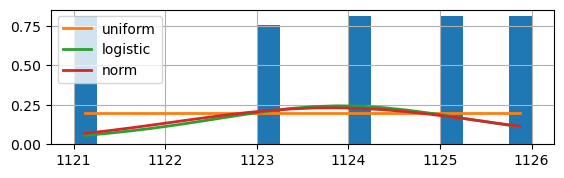

No outliers was found! 
 Acceptable values range by IQR: [1120.0, 1128.0] 
 Observed values range: [1121.0, 1126.0] 

**************************************LAT**************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
logistic,4103.258,-68.153,-1977520.652,0.110,0.0
exponnorm,5433.346,-67.871,-1857909.271,0.182,0.0
norm,5433.367,-69.871,-1857920.642,0.182,0.0


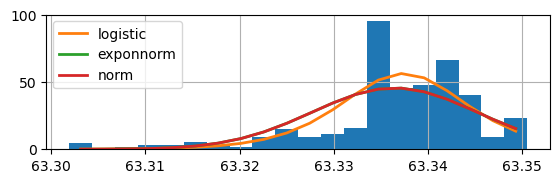

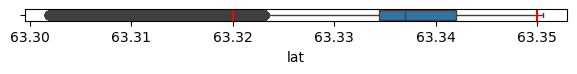

**************************************LON**************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
logistic,2441.206,-78.929,-2198717.132,0.137,0.0
exponnorm,2590.309,-79.272,-2173451.097,0.171,0.0
norm,2590.310,-81.272,-2173463.847,0.171,0.0


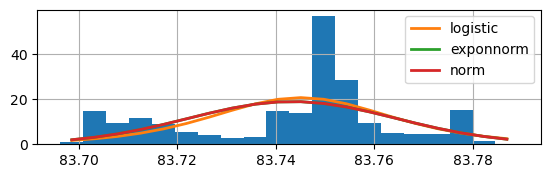

No outliers was found! 
 Acceptable values range by IQR: [83.69, 83.8] 
 Observed values range: [83.7, 83.79] 

*************************************SPEED*************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,0.005,229.494,-7739252.063,0.357,0.0
exponnorm,0.011,185.862,-7440090.385,0.235,0.0
expon,0.011,183.721,-7439788.297,0.236,0.0


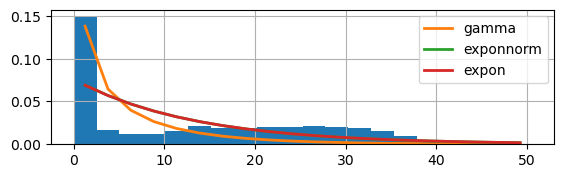

No outliers was found! 
 Acceptable values range by IQR: [-35.15, 60.13] 
 Observed values range: [0.0, 50.5] 

*************************************HEIGHT************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
logistic,0.0,361.486,-9401430.924,0.206,0.0
norm,0.0,372.861,-9377154.666,0.244,0.0
exponnorm,0.0,374.860,-9377141.193,0.244,0.0


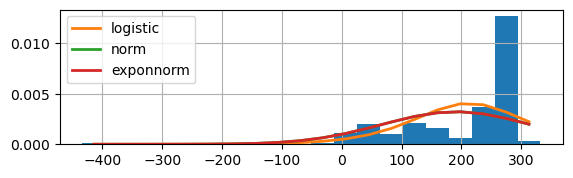

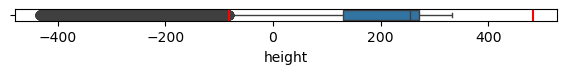

***********************************FUEL_CONS***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,0.0,297.564,-9771756.287,0.121,0.0
exponnorm,0.0,278.623,-9419358.376,0.259,0.0
expon,0.0,276.183,-9415500.091,0.262,0.0


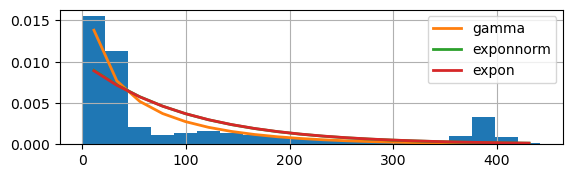

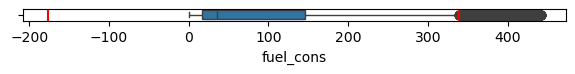

**********************************ENGINE_SPEED*********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,inf,inf,inf,NaN,NaN
norm,inf,inf,inf,NaN,NaN
logistic,inf,inf,inf,NaN,NaN


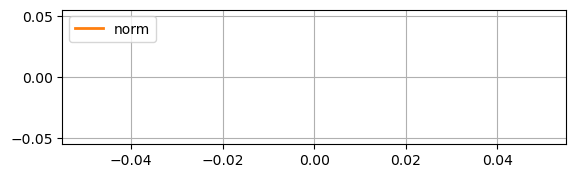

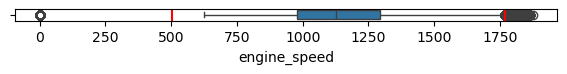

**************************************HDOP*************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
exponnorm,0.009,217.227,-7521829.583,0.434,0.0
expon,0.009,215.203,-7520656.875,0.433,0.0
lognorm,0.009,234.199,-7519729.118,0.215,0.0


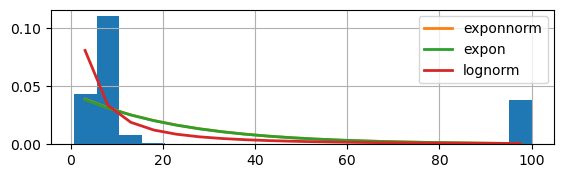

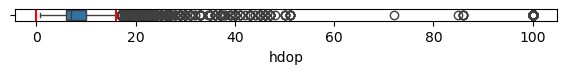

********************************FUEL_TANK_LEVEL********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,inf,inf,inf,NaN,NaN
lognorm,inf,inf,inf,NaN,NaN
expon,inf,inf,inf,NaN,NaN


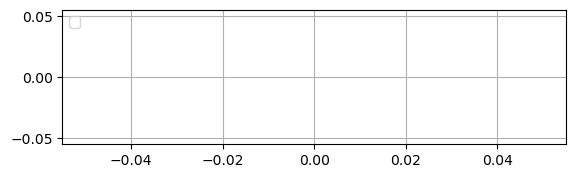

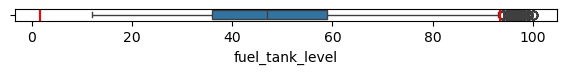

*********************************WEIGHT_DYNAMIC********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
norm,inf,inf,inf,NaN,NaN
gamma,inf,inf,inf,NaN,NaN
logistic,inf,inf,inf,NaN,NaN


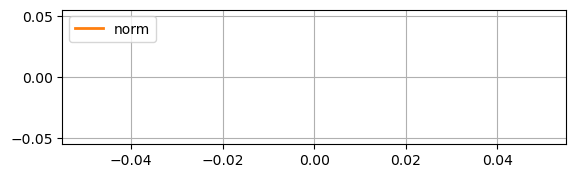

*************************************WEIGHT************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,inf,inf,inf,NaN,NaN
lognorm,inf,inf,inf,NaN,NaN
norm,inf,inf,inf,NaN,NaN


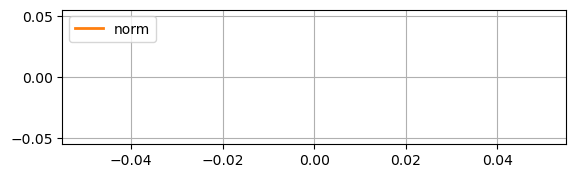

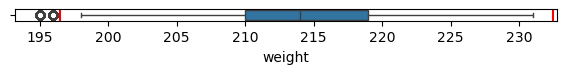

************************************DRIVERID***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
norm,inf,inf,inf,NaN,NaN
logistic,inf,inf,inf,NaN,NaN
lognorm,inf,inf,inf,NaN,NaN


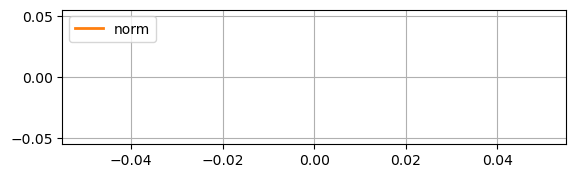

************************************DISTANCE***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,inf,inf,inf,NaN,NaN
logistic,inf,inf,inf,NaN,NaN
norm,inf,inf,inf,NaN,NaN


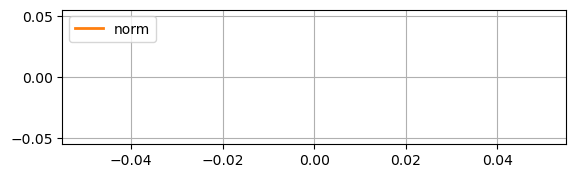

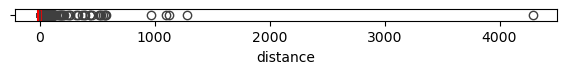

**************************************HOUR*************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
uniform,0.004,129.420,-7844960.920,0.042,0.0
lognorm,0.010,138.515,-7468795.766,0.078,0.0
gamma,0.010,138.496,-7468276.003,0.078,0.0


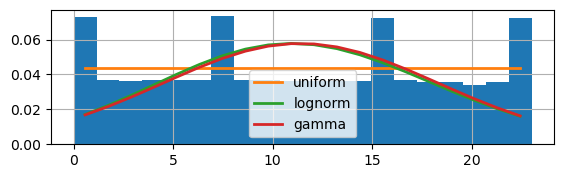

No outliers was found! 
 Acceptable values range by IQR: [-13.0, 35.0] 
 Observed values range: [0.0, 23.0] 

**********************************TEMPERATURE**********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
uniform,1.312,81.836,-5405570.765,0.269,0.0
expon,1.402,94.164,-5377350.435,0.216,0.0
lognorm,1.452,91.691,-5362434.959,0.251,0.0


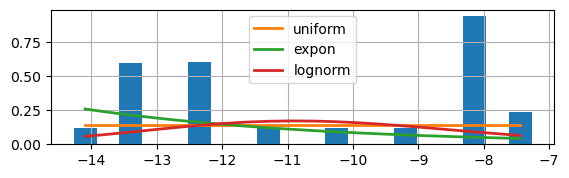

No outliers was found! 
 Acceptable values range by IQR: [-20.77, -0.77] 
 Observed values range: [-14.27, -7.27] 

******************************APPARENTTEMPERATURE******************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
gamma,0.127,110.943,-6398997.596,0.203,0.0
uniform,0.130,98.697,-6389941.939,0.232,0.0
expon,0.132,111.426,-6384669.351,0.196,0.0


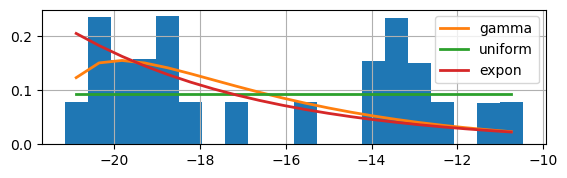

No outliers was found! 
 Acceptable values range by IQR: [-30.14, -3.14] 
 Observed values range: [-21.15, -10.48] 

************************************DEWPOINT***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
exponnorm,0.199,106.941,-6209489.813,0.154,0.0
lognorm,0.221,108.012,-6163776.561,0.157,0.0
gamma,0.234,105.296,-6139968.603,0.150,0.0


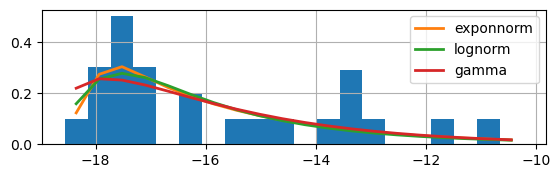

No outliers was found! 
 Acceptable values range by IQR: [-23.29, -8.09] 
 Observed values range: [-18.56, -10.24] 

************************************HUMIDITY***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
exponnorm,0.009,152.860,-7514297.167,0.081,0.0
norm,0.009,150.861,-7514309.357,0.081,0.0
logistic,0.009,149.532,-7512630.364,0.076,0.0


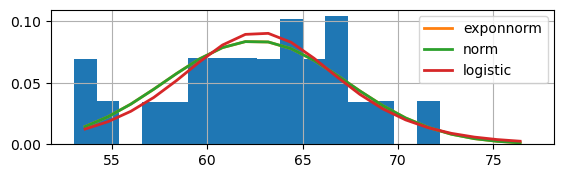

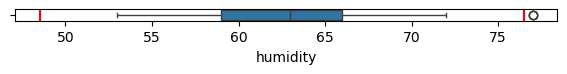

************************************PRESSURE***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
exponnorm,0.160,115.171,-6301606.405,0.137,0.0
expon,0.160,113.163,-6301448.613,0.138,0.0
uniform,0.188,99.916,-6233648.480,0.272,0.0


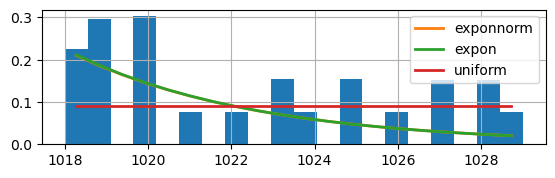

No outliers was found! 
 Acceptable values range by IQR: [1008.5, 1036.5] 
 Observed values range: [1018.0, 1029.0] 

***********************************WINDSPEED***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
logistic,2.689,58.113,-5099905.662,0.127,0.0
lognorm,2.822,56.709,-5079400.704,0.172,0.0
norm,2.824,54.616,-5079169.208,0.173,0.0


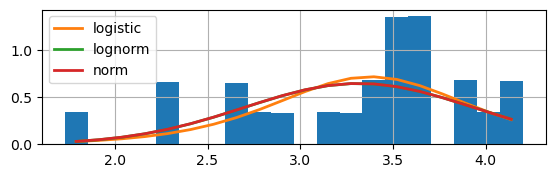

No outliers was found! 
 Acceptable values range by IQR: [1.61, 4.94] 
 Observed values range: [1.73, 4.2] 

************************************WINDGUST***********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
uniform,0.910,72.117,-5561539.362,0.244,0.0
lognorm,1.048,82.332,-5501371.749,0.198,0.0
norm,1.048,80.307,-5501336.107,0.198,0.0


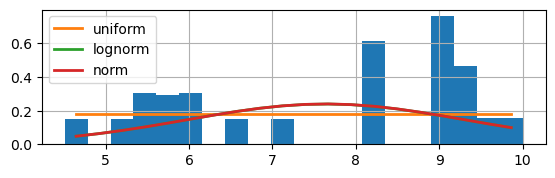

No outliers was found! 
 Acceptable values range by IQR: [1.11, 13.91] 
 Observed values range: [4.51, 10.0] 

**********************************WINDBEARING**********************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
lognorm,0.004,216.027,-7863289.904,0.142,0.0
gamma,0.004,216.549,-7840649.691,0.129,0.0
exponnorm,0.004,216.077,-7833852.013,0.135,0.0


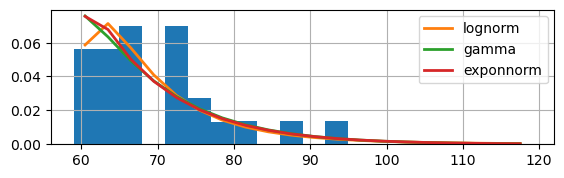

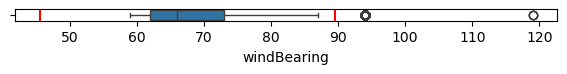

*************************************MINUTE************************************


,sumsquare_error,aic,bic,ks_statistic,ks_pvalue
uniform,0.000,167.101,-1.168532e+07,0.017,0.0
exponnorm,0.001,176.121,-8.622100e+06,0.065,0.0
norm,0.001,174.121,-8.622112e+06,0.065,0.0


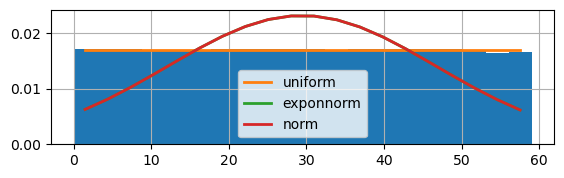

No outliers was found! 
 Acceptable values range by IQR: [-31.0, 89.0] 
 Observed values range: [0.0, 59.0] 



[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [100]:
[distexaminer(merged_mul[feat], verbose=1) for feat in merged_mul.columns]

По результатам анализа, не один параметр не демонстирует нормального распределения, ближе всего к нему распределение влажности. Сравнительно часто встречаются распределения с характером близким к равномерному илим логнормальному, а также би- и полимодальные распределения.

Проведём стандартизацию многоклассовых признаков

Поскольку признаки по своему значению могут различаться на несколько порядков, проводим стандартизацию данных

In [105]:
scaler=StandardScaler()
merged_mul=pd.DataFrame(scaler.fit_transform(merged_mul), 
                        index=merged_mul.index,
                        columns=merged_mul.columns)

In [107]:
merged=pd.concat([merged_mul, merged_bin], axis=1)

<Axes: >

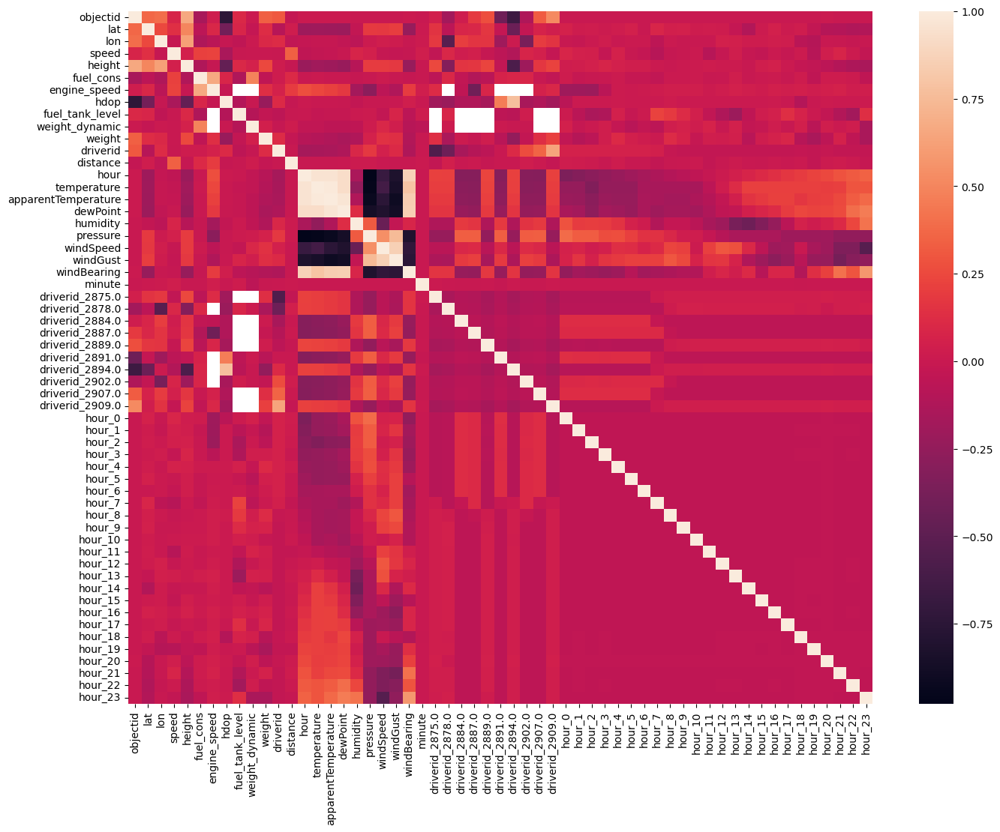

In [109]:
plt.figure(figsize=[16, 12])
sns.heatmap(merged.corr())

Для удобства, обрежем по горизонтали часть матрицы содержащей бинарные элементы (там все корреляции признаков водителя илии часа кроме корреляции на самих себя, равны нулю ) и разделим их на матрицу корреляции многоклассных переменных и матрицу коррелляции многоклассных и бинарных переменных

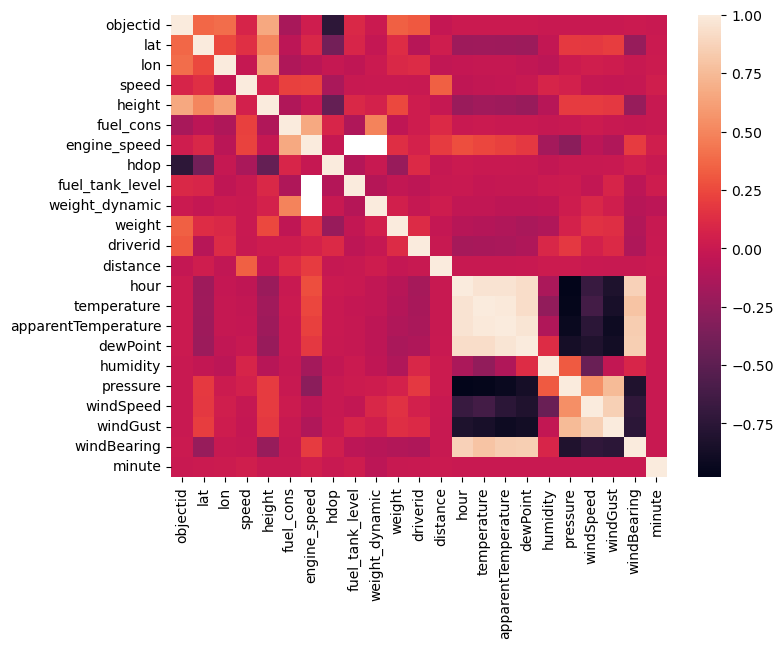

In [111]:
plt.figure(figsize=[8, 6])
sns.heatmap(merged.corr().loc[:'minute', :'minute'])
plt.show()

Посмотрим как коррелируются многоклассовые признаки с бинарными.

Мы наблюдаем высокий уровень корреляции между номером самосвала и высотной коррекцией, скорее всего носит случайный характер. Коррекция также коррелируется с широтой и высотой. Высокие положительные корреляции наблюдаются между уровнем бензина в баке, его расходом и скоростью двигателя. Высота достаточна хорошо коррелируется с высотой, следовательно увеличение высоты происходит в северо-восточном направлении. Высокая положительная корреляция наблюдается также между часом суток ощущаемой и действительной температурами и точкой росы, и все эти параметры отрицательно коррелированы с давлением, скоростью ветра и скоростью его порывов и его направления. 


In [114]:
# scaler=StandardScaler()
# merged=pd.DataFrame(scaler.fit_transform(merged), index=merged.index, columns=merged.columns)

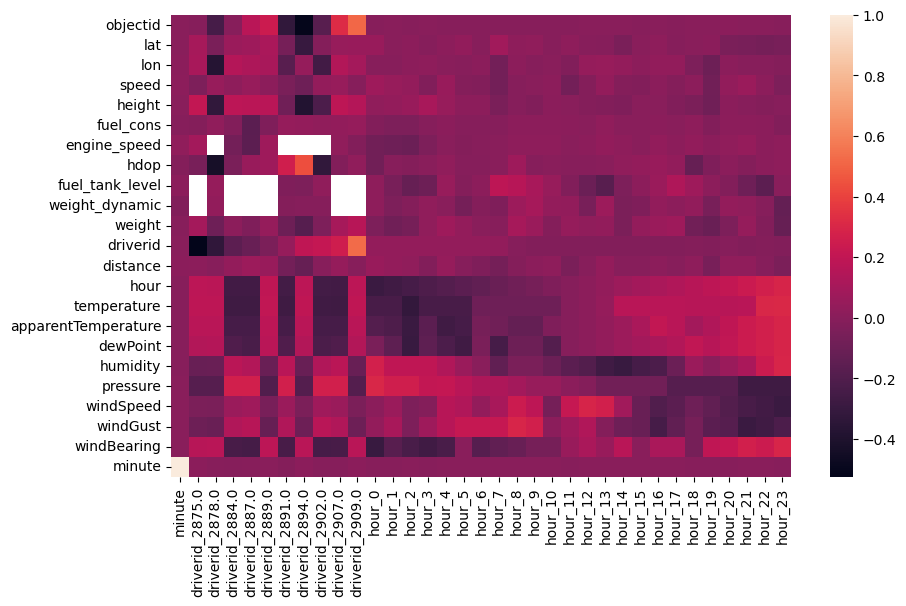

In [115]:
plt.figure(figsize=[10, 6])
sns.heatmap(merged.corr(method='kendall').loc[:'minute', 'minute':], )
plt.show()

Здесь мы видим что у водителей имеются особенности обслуживаемой ими "географии". Так, водитель 2884 не работает на высотных участках (возможно там требуется более опытный волитель). В целом, интерпретировать зависимости трудно.

In [118]:
# merged=pd.get_dummies(merged, columns=['hour'])

<!--  Посмотрим каков характер распределения остальных параметров и проверим их на нормальность -->

In [120]:
# Normality_checker(merged, methods=['normaltest', 'shapiro'])

In [121]:
# features=merged.columns
# for feat in features:
#         distexaminer(merged[feat], verbose=1, method='Sigma')

In [122]:
features=merged.columns.drop(['objectid'])
# truckid=list(telemetry_data.objectid.unique())
# truckid

## Задание 3

**Обучить модель для предсказания значений скорости самосвала (колонка speed)**
* Можно (и даже нужно) генерировать дополнительные фичи.
* Выполнить необходимые (на Ваш взгляд) преобразования датасета.
* Выбрать метрику(и) для оценки качества модели, объяснить причину выбора данной метрики
* Обучить несколько моделей и сравнить их. Интерпретировать результаты.

Построим модель и оптимизируем её гиперпараметры

In [126]:
X = merged.drop(['speed'], axis=1)
y = merged['speed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

catboost_model = CatBoostRegressor()
catboost_model.fit(X_train, y_train)

lgbm_model = LGBMRegressor()
lgbm_model.fit(X_train, y_train)

xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)

catboost_preds = catboost_model.predict(X_test)
lgbm_preds = lgbm_model.predict(X_test)
xgb_preds = xgb_model.predict(X_test)

catboost_rmse = np.sqrt(mean_squared_error(y_test, catboost_preds))
lgbm_rmse = np.sqrt(mean_squared_error(y_test, lgbm_preds))
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_preds))

catboost_mape = mean_absolute_percentage_error(y_test, catboost_preds)
lgbm_mape = mean_absolute_percentage_error(y_test, lgbm_preds)
xgb_mape = mean_absolute_percentage_error(y_test, xgb_preds)


print(f'CatBoost RMSE: {catboost_rmse}')
print(f'LightGBM RMSE: {lgbm_rmse}')
print(f'XGBoost RMSE: {xgb_rmse}')
print('______________________________________________________________')
print(f'CatBoost MAPE: {catboost_mape}')
print(f'LightGBM MAPE: {lgbm_mape}')
print(f'XGBoost MAPE: {xgb_mape}')
# Task 3: Model Comparison
# Compare model performance and interpret results

Learning rate set to 0.101831
0:	learn: 0.9253218	total: 205ms	remaining: 3m 24s
1:	learn: 0.8599239	total: 232ms	remaining: 1m 55s
2:	learn: 0.8023556	total: 258ms	remaining: 1m 25s
3:	learn: 0.7521536	total: 284ms	remaining: 1m 10s
4:	learn: 0.7080685	total: 313ms	remaining: 1m 2s
5:	learn: 0.6684837	total: 339ms	remaining: 56.2s
6:	learn: 0.6346527	total: 368ms	remaining: 52.2s
7:	learn: 0.6053608	total: 396ms	remaining: 49.1s
8:	learn: 0.5794349	total: 419ms	remaining: 46.2s
9:	learn: 0.5578726	total: 445ms	remaining: 44s
10:	learn: 0.5395975	total: 473ms	remaining: 42.5s
11:	learn: 0.5235909	total: 500ms	remaining: 41.2s
12:	learn: 0.5092099	total: 530ms	remaining: 40.2s
13:	learn: 0.4965451	total: 558ms	remaining: 39.3s
14:	learn: 0.4853552	total: 589ms	remaining: 38.7s
15:	learn: 0.4760480	total: 618ms	remaining: 38s
16:	learn: 0.4660138	total: 649ms	remaining: 37.5s
17:	learn: 0.4584786	total: 675ms	remaining: 36.9s
18:	learn: 0.4516914	total: 699ms	remaining: 36.1s
19:	learn: 

Минимальная ошибка наблюдается у модели XGBoost. Настроим её гиперпараметры.

In [128]:
# !pip install optuna

In [130]:
import optuna
from optuna.visualization import *

In [131]:
sampler = optuna.samplers.TPESampler(seed=42)
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 20, 70, step=3),
        'learning_rate': trial.suggest_float('learning_rate', 0, 0.1, step=0.001),
        'solver': trial.suggest_categorical('solver', ['gbtree','gblinear']),
        'max_depth': trial.suggest_int('max_depth', 20, 70, step=5),
        'gamma': trial.suggest_float('gamma', 0, 1, step=0.05)}
    model = XGBRegressor(**params)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    mape = mean_absolute_percentage_error(y_test, predictions)
    return mape

study = optuna.create_study(direction='minimize', study_name="XGBR", sampler=sampler)
study.optimize(objective, n_trials=20)

[I 2024-04-09 06:28:12,283] A new study created in memory with name: XGBR
[I 2024-04-09 06:28:26,373] Trial 0 finished with value: 2.214425092790681 and parameters: {'n_estimators': 38, 'learning_rate': 0.096, 'solver': 'gbtree', 'max_depth': 25, 'gamma': 0.15000000000000002}. Best is trial 0 with value: 2.214425092790681.
[I 2024-04-09 06:28:32,569] Trial 1 finished with value: 3.7808541153020148 and parameters: {'n_estimators': 20, 'learning_rate': 0.08700000000000001, 'solver': 'gblinear', 'max_depth': 20, 'gamma': 1.0}. Best is trial 0 with value: 2.214425092790681.
[I 2024-04-09 06:28:51,354] Trial 2 finished with value: 3.0134929862057764 and parameters: {'n_estimators': 62, 'learning_rate': 0.021, 'solver': 'gblinear', 'max_depth': 35, 'gamma': 0.55}. Best is trial 0 with value: 2.214425092790681.
[I 2024-04-09 06:29:06,566] Trial 3 finished with value: 2.4272237213048777 and parameters: {'n_estimators': 41, 'learning_rate': 0.029, 'solver': 'gbtree', 'max_depth': 35, 'gamma': 0

Выбираем оптимальные значения для нашей модели и оцениваем ощибки (RMSE и MAPE)

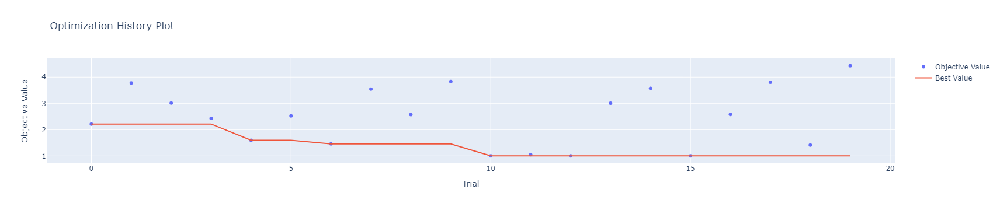

In [133]:
plot_optimization_history(study)

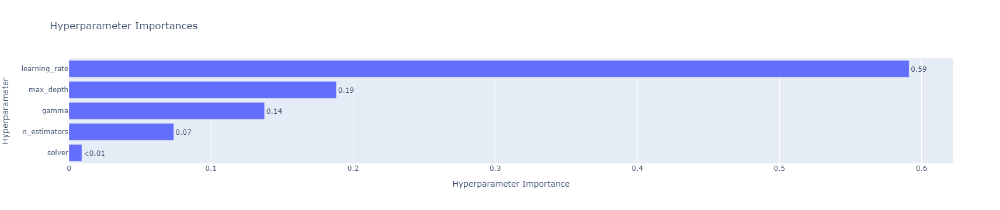

In [134]:
plot_param_importances(study)

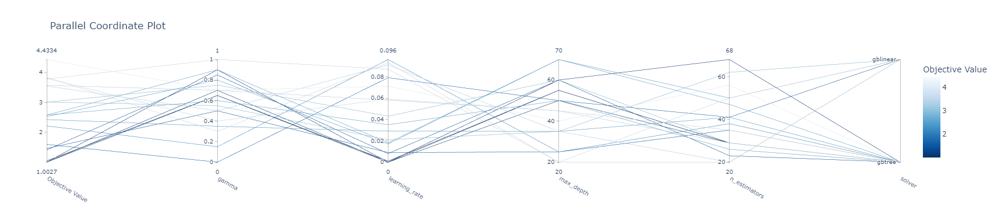

In [135]:
plot_parallel_coordinate(study)

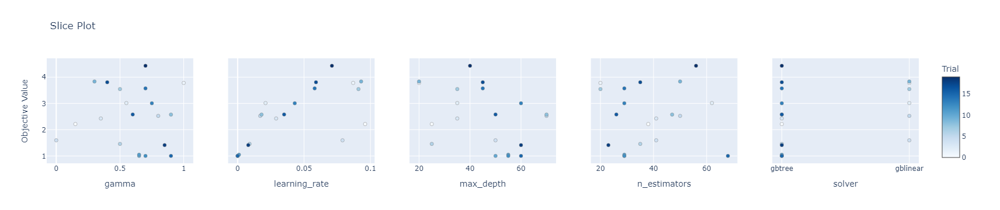

In [136]:
plot_slice(study)

In [137]:
mape_opt=mean_absolute_percentage_error(y_test, XGBRegressor(**study.best_params).fit(X_train, y_train).predict(X_test)) 
rmse_opt=mean_squared_error(y_test, XGBRegressor(**study.best_params).fit(X_train, y_train).predict(X_test), squared=False) 
print('Погрешности модели: \n 'f'* RMSE Модели {rmse_opt.round(4)} \n * MAPE: {mape_opt.round(4)} %')

Погрешности модели: 
 * RMSE Модели 1.001 
 * MAPE: 1.0027 %




Модели показывают приемлемое качество предсказания.

### Выводы и обсуждение

1. Мы изучили данные телеметрии по самосвалам работающим на месторождении. Данные датасетов телеметрии и погоды позволяют:

* Получить представление о рельефе местности, определить точки погрузки/выгрузки породы, а также точки начала движения
* Выявить особенности применения самосвалов
* Выяснить назначение датчика, обозначенного в датасете как "w_fl"
* Обогащением основного датасета повышает точность предсказания модели

2. Подготовленные данные, после конструирования признаков и стандартизации использованы для построения моделей. Мы построили 3 модели на алгоритвах экстремального градиентного спуска, LightGBM и CatBoost.
Минимальное значение ошибки отмечается у XGB,  для него и производена дальнейшая оптимизация с использованием Optuna.

Дальнейшие действия:

* Полученные модели хорошо показывают себя на тестовой выборке, но надо понимать что данные содержат уникальные для данного датасета признаки водителя. Но водители распределены по машинам и закреплены за ними, а следовательно при переходе на новые машины, данные бинарные признаки не будут применимы () и модель придётся строить заново. При необходимости предсказания скорости для иных машин, лучше построить модель не зависящую от данного параметра.

* По карте непонятно назначение самосвала 1121, у него средняя скорость ниже и очень сильно варьируются маршруты рейсов (возможно вспомогательные функции). Самосвал 1123 самые "скоростой", но у него свой особый повторяющийся маршрут, отличимый от сходных между собой маршрутов для самосвалов 1124-1126. Выяснение назначений грузовиков, может помочь построить более точную по своим показаниям модель.

* Не вполне понятна логика комплектации самосвалов датчиками телеметрии и странные показания ряда из них (альтиметр 1123, датчики GPS)
